In [45]:
import numpy as np
import napari
import pickle
from skimage import data
from scipy import stats
from scipy import signal
from tifffile import tifffile
from os.path import sep
from matplotlib import pyplot as plt
import math
import matplotlib.colors as colors
import xarray as xr
import pandas as pd
import seaborn as sns
import json
import os
from scipy.ndimage import gaussian_filter1d

In [46]:
import SessionTools.two_photon as st2p
from fly2p_function_TQ.imaging_2p_preprocessing import combine_single_tiff,combine_single_tiff_V3, computeMotionShift, motionCorrection, low_pass_filter_TQ, high_pass_filter_TQ, averaging_frame,combine_single_tiff_ch1
from fly2p_function_TQ.imaging_2p_preprocessing import combine_PB_corresponding_ROI,get_raw_F,get_dff_array, normalizing_dff_array, combine_single_tiff_V2, combine_EB_corresponding_ROI
from fly2p_function_TQ.imaging_2p_PVA_functions import PVA_radian_calcul, PVAangleToRoi, PVA_radian_to_angle, PVA_angle_to_radian, calcualteBumpAmplitude,pol2cart,calcualteBumpAmplitude_V3,calculateBumpWidth_v1,PVA_radian_calcul_norm
from fly2p_function_TQ.imaging_2p_fictrac_imaging_alignment import downsample_heading_to_total_volume, offset_calculation,fictrack_signal_decoding,moving_wrapped_plot_by_offset
from fly2p_function_TQ.imaging_2p_delta7_write_in_ex_vivo import analyze_peak_shifted_activity,process_group,plot_group_comparison

In [47]:
# Some key parameters for imaging analysis (for futuure should come from direct reading of metadata file)
volume_cycle = 2785
volume_time = 0.10773
volume_rate = 1/volume_time
slice_per_volume = 9
fictrack_sampling_rate = 50000

# 1 for cl, 0 for dark trial
trial_type = 0

# 1 for PB, 0 for EB, 2 for FB 
brain_region = 1

#1 for yes, 0 for no
bar_jumping = 0

In [4]:
time_array_imaging = np.arange(volume_cycle)/volume_rate

In [5]:
image_data_combined, tiff_file_sequence = combine_single_tiff(slice_num = slice_per_volume, cycle_num = volume_cycle, file_dir = '/home/tianhaoqiu/Desktop/TQfly773-004')

In [6]:
image = image_data_combined
imgStack = xr.DataArray(image,dims = ['volumes [s]', 'planes [µm]', 'xpix [µm]', 'ypix [µm]'])

In [7]:
imgStack_napari = np.expand_dims(imgStack, axis =0)

In [8]:
imgStack_napari.shape

(1, 2785, 9, 161, 356)

In [9]:
viewer = napari.Viewer()
new_layer = viewer.add_image(imgStack_napari.mean(axis=1))

In [10]:
label = tifffile.imread("/home/tianhaoqiu/Documents/GitHub/2p_analysis/napari_roi/EPG_write_in/Power curve/R60D05_lexopCsCHtdT_R60D05_syt7f/TQfly773/ROI_16_TQfly773-004.tif")
napari_roi = np.squeeze(label , axis=0) 

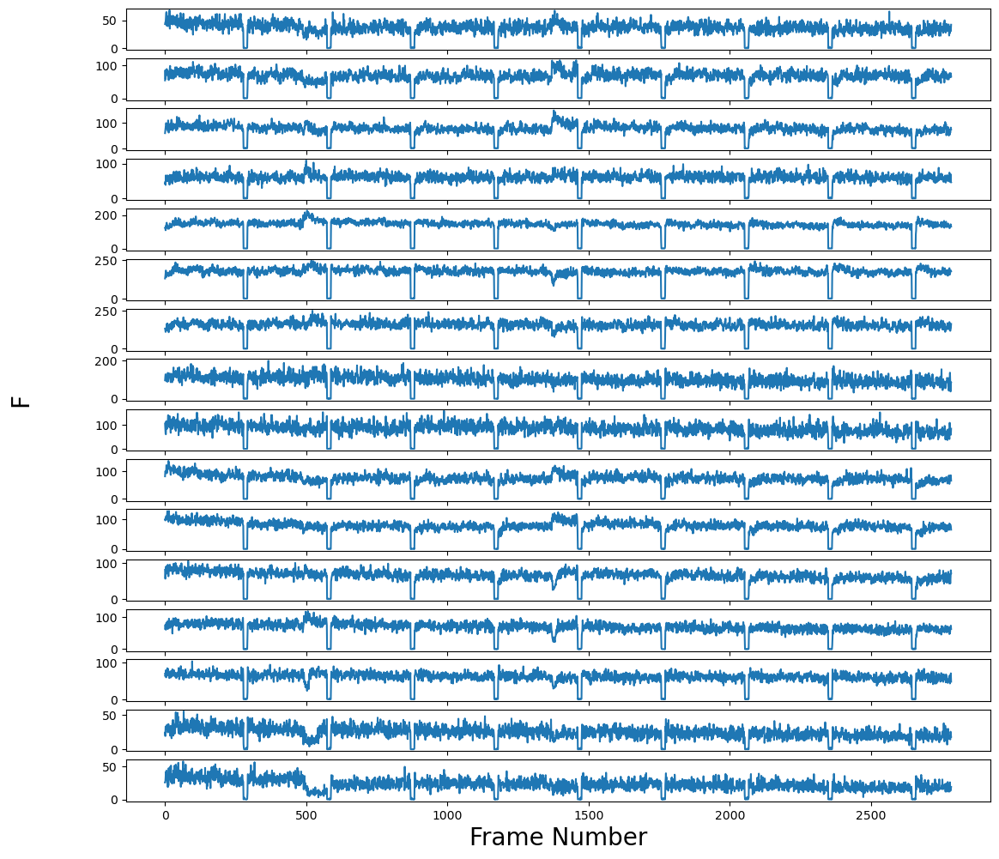

In [11]:
ROI_total = 16
F_array = get_raw_F(ROI_total, napari_roi, imgStack)

In [12]:
# Define parameters
thresholds = np.percentile(F_array, 5, axis=0)  # Compute separate threshold per ROI (3th percentile)
min_duration = 13 # Minimum number of frames for a valid stimulation period
start_frame = 100  # Ignore the first 100 frames before detecting stimulation

# Step 1: Detect low-signal frames per ROI
low_signal_per_roi = F_array < thresholds  # Boolean mask: True where signal is below threshold

# Step 2: Identify frames where **any** ROI detects a stimulation period
low_signal_any = np.any(low_signal_per_roi, axis=1)  # If any ROI marks this frame, it's a stim frame

# Step 3: Find contiguous low-signal periods **starting from frame 100**
stimulation_periods = []
current_start = None

for i in range(start_frame, len(low_signal_any)):  # Start from frame 100
    if low_signal_any[i]:  # If any ROI classifies this frame as stim
        if current_start is None:
            current_start = i  # Mark the start of a stimulation period
    else:
        if current_start is not None:
            # Check if the stim period is long enough
            if i - current_start >= min_duration:
                stimulation_periods.append((current_start, i - 1))
            current_start = None  # Reset

# Handle the last stimulation period if it extends until the end
if current_start is not None and len(low_signal_any) - current_start >= min_duration:
    stimulation_periods.append((current_start, len(low_signal_any) - 1))

# Print results
print("Detected Stimulation Periods (starting from frame 100):", stimulation_periods)


Detected Stimulation Periods (starting from frame 100): [(278, 292), (574, 587), (870, 884), (1166, 1179), (1370, 1384), (1461, 1475), (1757, 1772), (2053, 2070), (2349, 2363), (2645, 2661)]


In [13]:
# Step 1: Create a mask for removal
frames_to_keep = np.ones(F_array.shape[0], dtype=bool)  # Keep all frames initially

for start, end in stimulation_periods:
    frames_to_keep[start:end+1] = False  # Mark stimulation frames as False (to be removed)


# Step 2: Apply mask to remove stimulation frames
F_array_stimulation_period_removed = F_array[frames_to_keep]

# Step 3: Find correct post-stimulation indices in `filtered_data`
stimulation_durations = np.zeros(len(stimulation_periods))
for i in range(len(stimulation_periods)):
    stimulation_durations[i] = stimulation_periods[i][1] - stimulation_periods[i][0] + 1

cut_indices = np.zeros(len(stimulation_periods))
for j in range(len(stimulation_periods)):
    cut_indices[j] = (stimulation_periods[j][1] + 1) - (np.sum(stimulation_durations[0:(j+1)]))
cut_indices = cut_indices.astype(int)

# Step 4: Print results
print("Original shape:", F_array.shape)
print("F_array_stimulation_period_removed :", F_array_stimulation_period_removed .shape)
print("Cut indices (in F_array_stimulation_period_removed ):", cut_indices)

Original shape: (2785, 16)
F_array_stimulation_period_removed : (2631, 16)
Cut indices (in F_array_stimulation_period_removed ): [ 278  559  841 1122 1312 1388 1669 1949 2227 2508]


In [14]:
volume_cycle_new = len(F_array_stimulation_period_removed )
time_array_imaging = np.arange(volume_cycle_new)/volume_rate

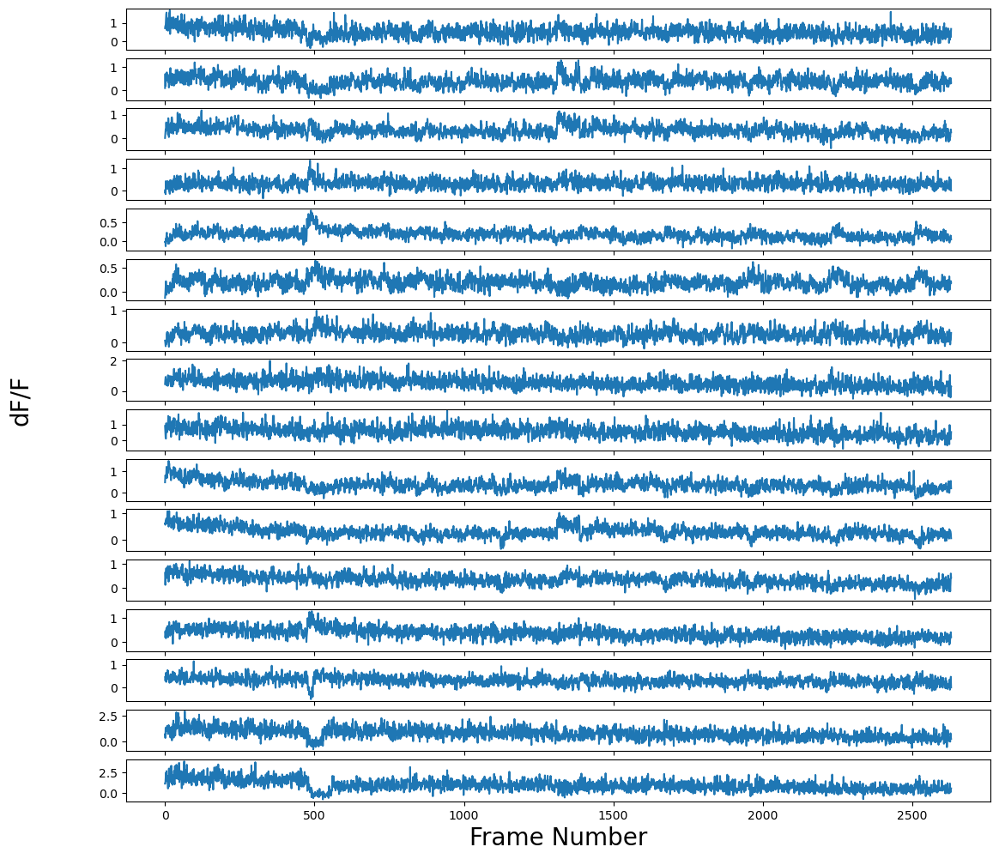

In [15]:
dF_F_array = get_dff_array(raw_F_array = F_array_stimulation_period_removed , ROI_num = ROI_total, F_zero_cutoff = 0.05, if_plot = 1)

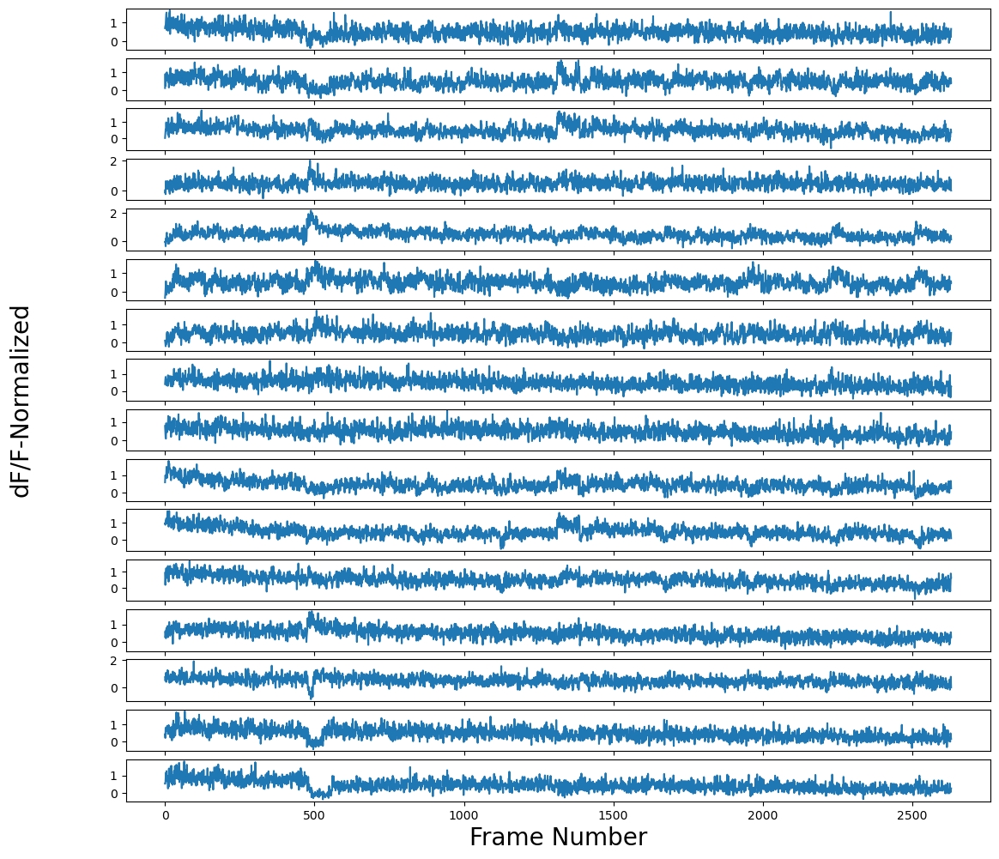

In [16]:
dF_F_array_normalized = normalizing_dff_array(dF_F_array,ROI_num= ROI_total, normalize_cutoff= 0.95, if_plot = 1)

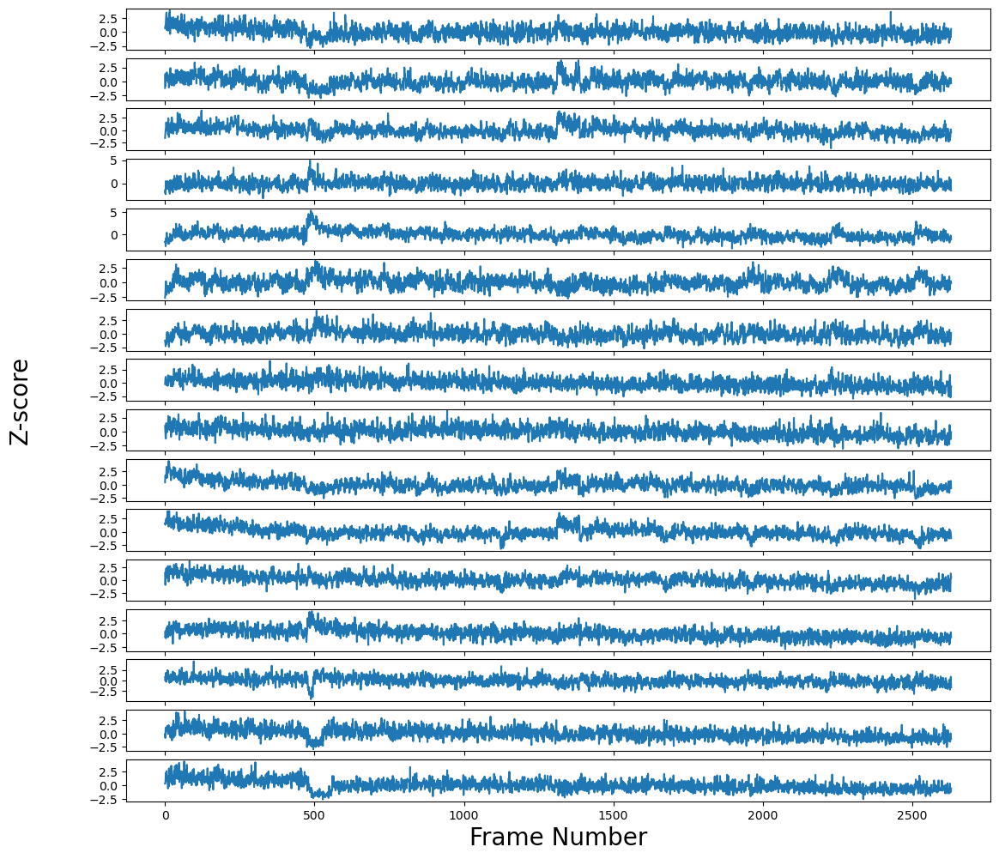

In [17]:
# Z-score: alternative way to calculate df/f
Z_score_array = np.zeros((len(F_array_stimulation_period_removed), ROI_total))
F_sd = np.std(F_array_stimulation_period_removed , axis = 0)
F_mean = np.mean(F_array_stimulation_period_removed , axis = 0)
for z_index in range(ROI_total):
    Z_score_array [:,z_index] = (F_array_stimulation_period_removed [:,z_index] - F_mean[z_index])/F_sd[z_index]

fig, axs = plt.subplots(ROI_total, 1, figsize=(13, 12))
for i in range(ROI_total):
    ax = axs[i]
    ax.plot(Z_score_array [:,i])
fig.supylabel('Z-score',fontsize=20)
plt.xlabel('Frame Number', fontsize=20)
plt.show()

In [18]:
#Median_filtering the normalized df_f trace
for i in range (ROI_total):
    dF_F_array_normalized[:,i] = signal.medfilt(dF_F_array_normalized[:,i],kernel_size =3)
    Z_score_array [:,i] = signal.medfilt(Z_score_array [:,i],kernel_size =3)

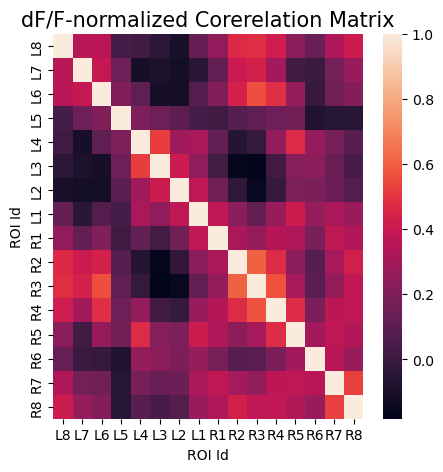

In [19]:
#Create a correlation matrix to look at the correlation between corresponding golemuruli in left/right PB
if ROI_total == 16:
    df_f_dataframe_normalized = pd.DataFrame(dF_F_array_normalized, columns=['L8', 'L7', 'L6','L5','L4','L3','L2','L1','R1','R2','R3','R4','R5','R6','R7','R8'])
    correlation_matrix_df_f = df_f_dataframe_normalized.corr()
    plt.figure(figsize= (5,5))
    sns.heatmap(correlation_matrix_df_f)
    plt.xlabel('ROI Id', fontsize=10)
    plt.ylabel('ROI Id', fontsize=10)
    plt.title('dF/F-normalized Corerelation Matrix', fontsize=15)

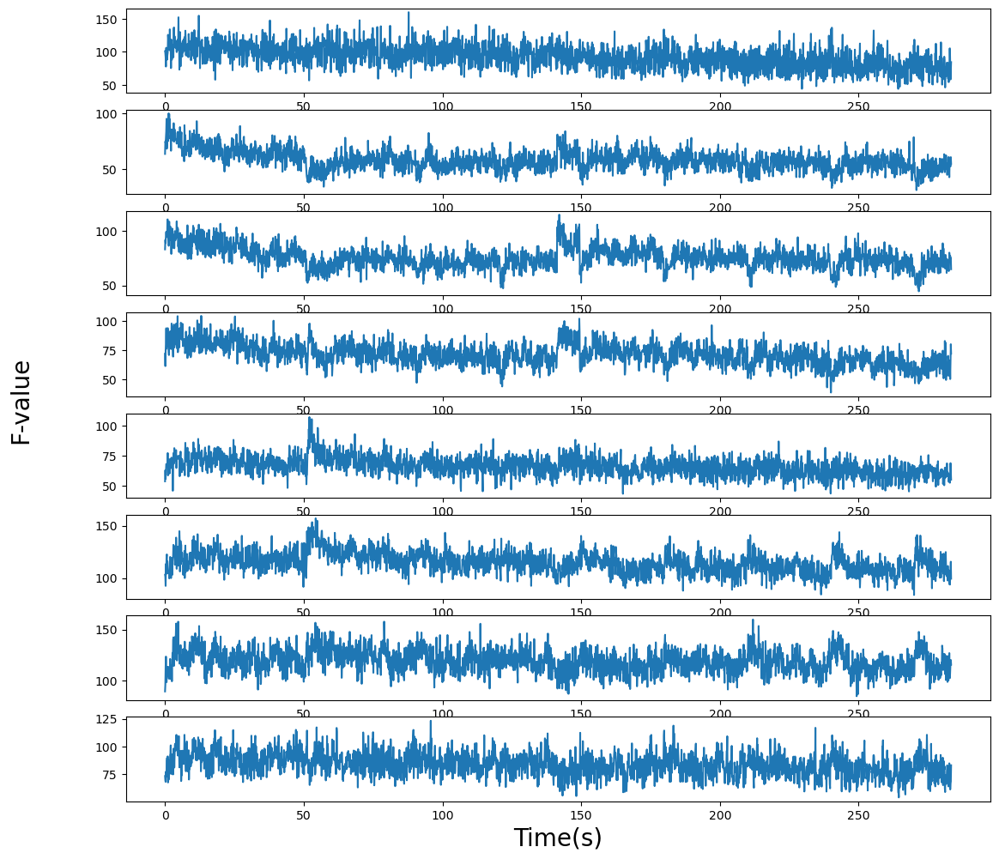

In [20]:
F_8_roi = combine_PB_corresponding_ROI(dff_array_input = F_array_stimulation_period_removed , napari_ROI = napari_roi , ROI_num = 8, mode =1, time_array_imaging = time_array_imaging)
ROI_number_combined = 8
fig, axs = plt.subplots(ROI_number_combined, 1, figsize=(13, 12))
for i in range(ROI_number_combined):
    ax = axs[i]
    ax.plot(time_array_imaging,F_8_roi[:,i])
fig.supylabel('F-value',fontsize=20)
plt.xlabel('Time(s)', fontsize=20)
plt.show()

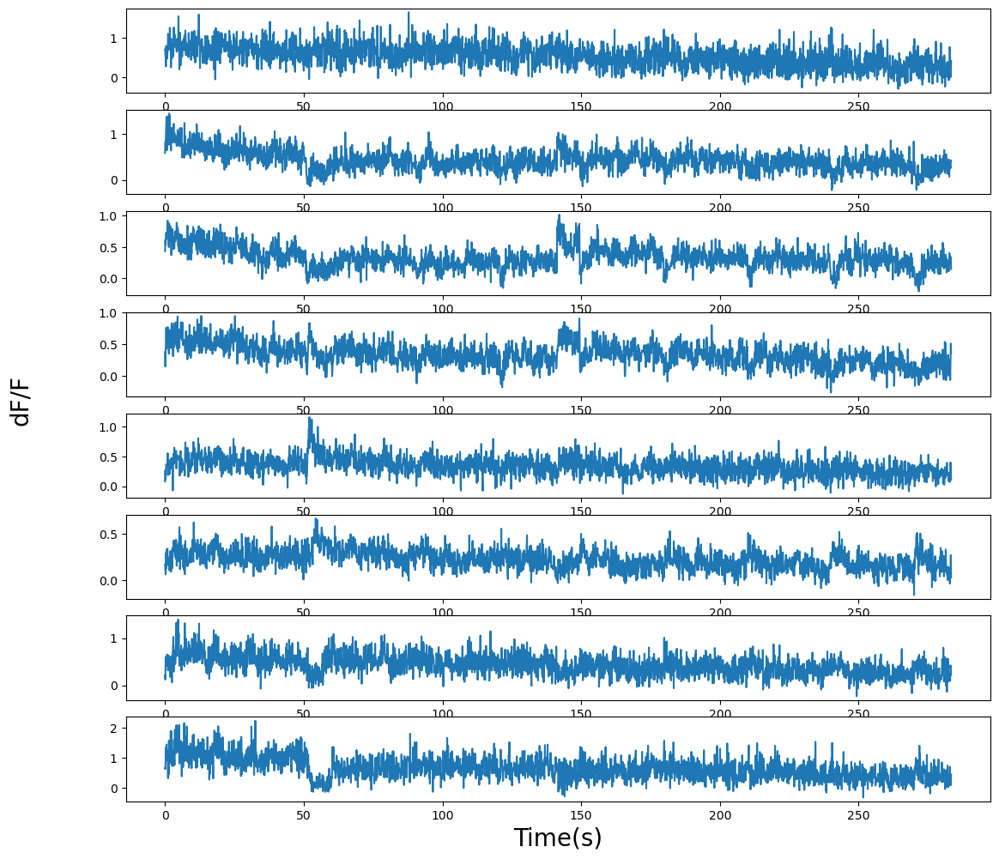

In [21]:
dF_F_array_8_roi = combine_PB_corresponding_ROI(dff_array_input = dF_F_array, napari_ROI = napari_roi , ROI_num = 8, mode = 1, time_array_imaging = time_array_imaging)
ROI_number_combined = 8
fig, axs = plt.subplots(ROI_number_combined, 1, figsize=(13, 12))
for i in range(ROI_number_combined):
    ax = axs[i]
    ax.plot(time_array_imaging, dF_F_array_8_roi[:,i])
fig.supylabel('dF/F',fontsize=20)
plt.xlabel('Time(s)', fontsize=20)
plt.show()

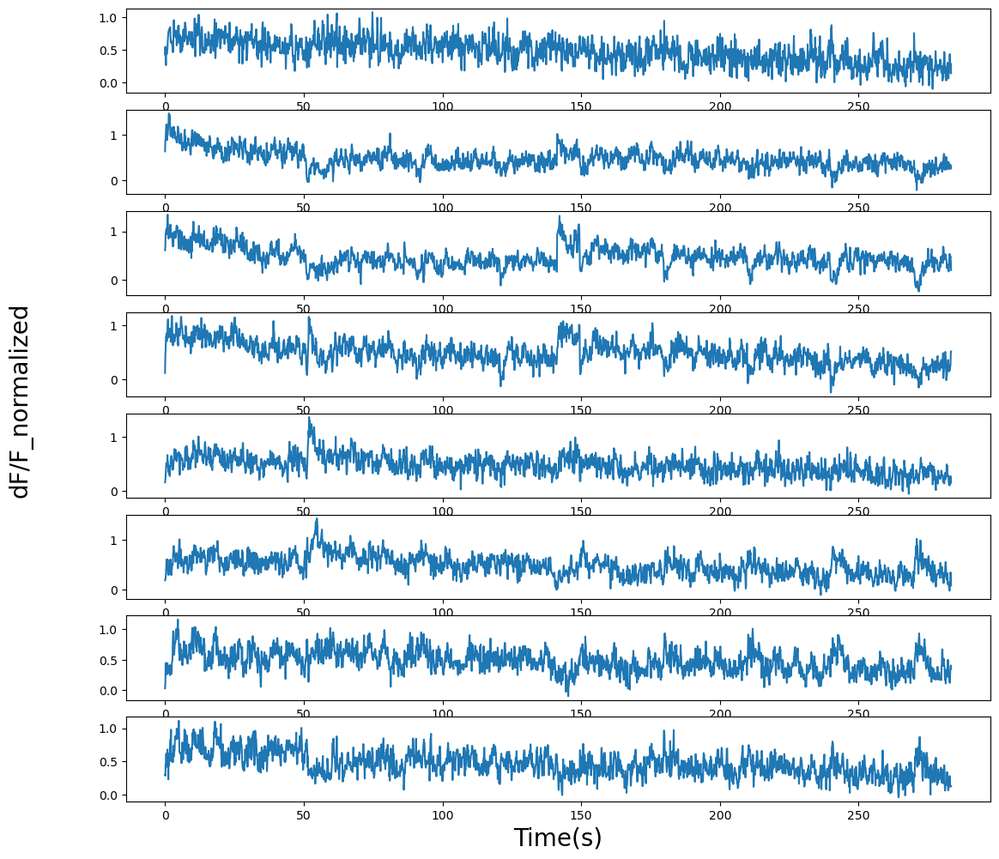

In [22]:
dF_F_array_8_roi_normalized = combine_PB_corresponding_ROI(dff_array_input = dF_F_array_normalized, napari_ROI = napari_roi , ROI_num = 8, mode = 1, time_array_imaging = time_array_imaging)
ROI_number_combined = 8
fig, axs = plt.subplots(ROI_number_combined, 1, figsize=(13, 12))
for i in range(ROI_number_combined):
    ax = axs[i]
    ax.plot(time_array_imaging, dF_F_array_8_roi_normalized[:,i])
fig.supylabel('dF/F_normalized',fontsize=20)
plt.xlabel('Time(s)', fontsize=20)
plt.show()

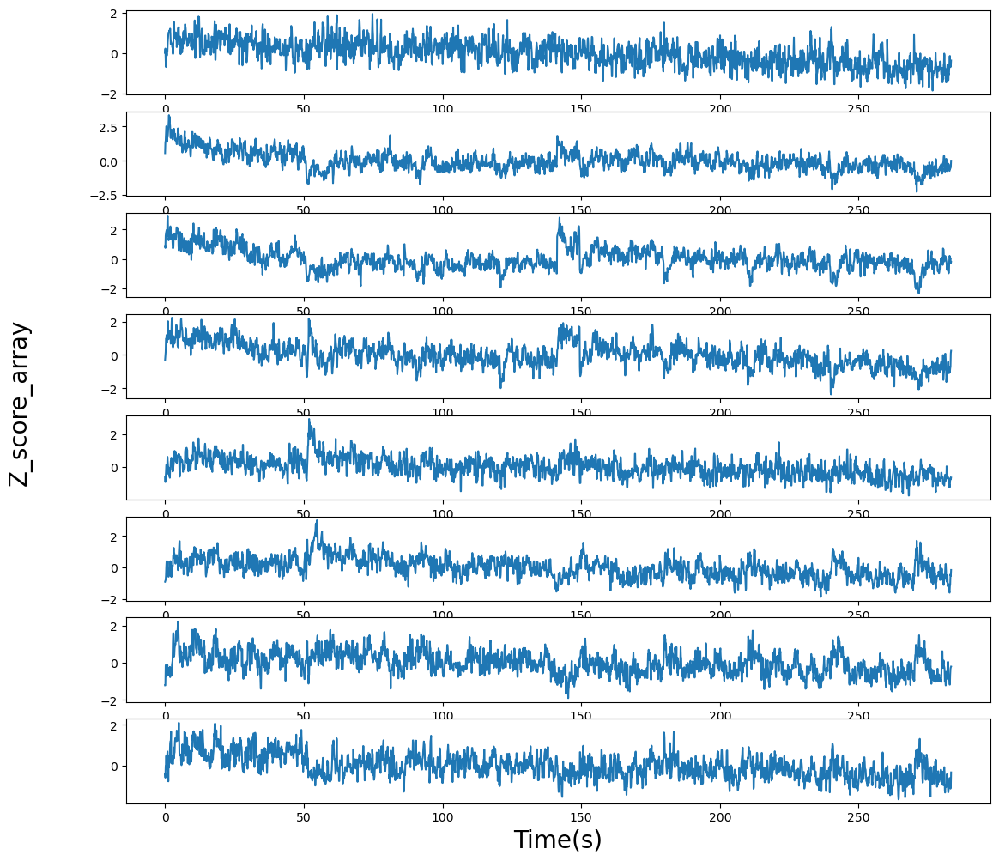

In [23]:
Z_score_array_8_roi = combine_PB_corresponding_ROI(dff_array_input = Z_score_array, napari_ROI = napari_roi , ROI_num = 8, mode = 1, time_array_imaging = time_array_imaging)   
ROI_number_combined = 8
fig, axs = plt.subplots(ROI_number_combined, 1, figsize=(13, 12))
for i in range(ROI_number_combined):
    ax = axs[i]
    ax.plot(time_array_imaging, Z_score_array_8_roi[:,i])
fig.supylabel('Z_score_array',fontsize=20)
plt.xlabel('Time(s)', fontsize=20)
plt.show()

In [24]:
PVA_radian_array, PVA_strength = PVA_radian_calcul(dF_F_array_8_roi, volume_cycle_new,ROI_number_combined )
PVA_radian_array_normalized, PVA_strength_normalized = PVA_radian_calcul(dF_F_array_8_roi_normalized, volume_cycle_new,ROI_number_combined)
PVA_radian_array_z, PVA_strength_z_scored = PVA_radian_calcul(Z_score_array_8_roi, volume_cycle_new,ROI_number_combined)

In [25]:
PVA_angle_Array = PVA_radian_to_angle(PVA_radian_array)
PVA_angle_Array_normalized = PVA_radian_to_angle(PVA_radian_array_normalized)
PVA_angle_array_z = PVA_radian_to_angle(PVA_radian_array_z)

In [26]:
if ROI_total == 16:
    PVA_radian_array_normalized_16, PVA_strength_normalized_16 = PVA_radian_calcul(dF_F_array_normalized, volume_cycle_new, 16)
    PVA_angle_Array_normalized_16  = PVA_radian_to_angle(PVA_radian_array_normalized_16 )

In [27]:
PVA_ROI_assigned = PVAangleToRoi(PVA_angle_Array)
PVA_ROI_assigned_normalized = PVAangleToRoi(PVA_angle_Array_normalized)
PVA_ROI_assigned_z = PVAangleToRoi(PVA_angle_array_z)

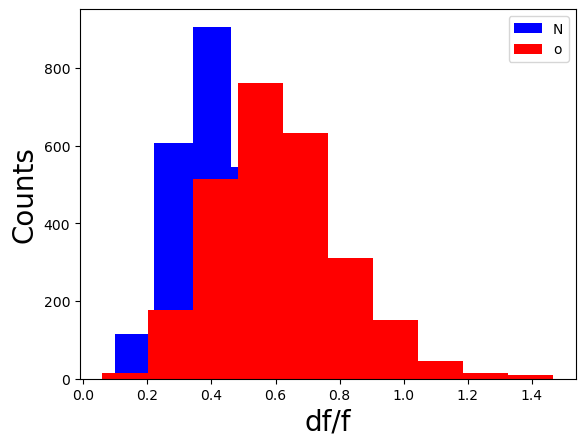

In [28]:
bump_amplitude_dff = calcualteBumpAmplitude(dF_F_array_8_roi)
bump_amplitude_dff_normalized = calcualteBumpAmplitude(dF_F_array_8_roi_normalized)
bump_amplitude_dff_normalized_v3 = calcualteBumpAmplitude_V3(dF_F_array_8_roi_normalized,PVA_radian_array_normalized)[0]
plt.hist(bump_amplitude_dff_normalized, color ='b')
plt.hist(bump_amplitude_dff_normalized_v3, color ='r')
plt.legend('Normalized')

plt.ylabel('Counts',fontsize=20)
plt.xlabel('df/f', fontsize=20)
plt.show()

In [29]:
stimulation_start_index = [pair[0] for pair in stimulation_periods]
stimulation_end_index = [pair[1] for pair in stimulation_periods]
pd_stimulation_periods = pd.DataFrame()
pd_stimulation_periods['stimulation_start_frame'] = stimulation_start_index
pd_stimulation_periods['stimulation_end_frame'] = stimulation_end_index
#pd_stimulation_periods.to_csv('/home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/SS00096_7f_CsCHtdT/for analysis/90-stimulation-index/TQfly542-006-stimulation-frame.csv',encoding = 'utf-8', index=False)

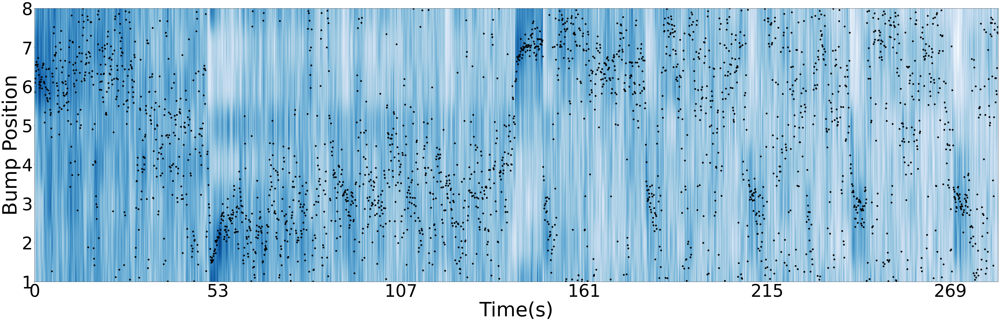

In [30]:
#Plot heatmap of signals in combined ROI and superimpose with PVA
df_dff_in_ROI_normalized = dF_F_array_8_roi_normalized.transpose()
df_dff_in_ROI_normalized_shifted = np.zeros((np.size(df_dff_in_ROI_normalized,0),np.size(df_dff_in_ROI_normalized,1)))
df_dff_in_ROI_normalized_shifted[0,:] = df_dff_in_ROI_normalized[4,:]
df_dff_in_ROI_normalized_shifted[1,:] = df_dff_in_ROI_normalized[5,:]
df_dff_in_ROI_normalized_shifted[2,:] = df_dff_in_ROI_normalized[6,:]
df_dff_in_ROI_normalized_shifted[3,:] = df_dff_in_ROI_normalized[7,:] 
df_dff_in_ROI_normalized_shifted[4,:] = df_dff_in_ROI_normalized[0,:] 
df_dff_in_ROI_normalized_shifted[5,:] = df_dff_in_ROI_normalized[1,:] 
df_dff_in_ROI_normalized_shifted[6,:] = df_dff_in_ROI_normalized[2,:] 
df_dff_in_ROI_normalized_shifted[7,:] = df_dff_in_ROI_normalized[3,:]
df_dff_in_ROI_normalized_shifted_for_plotting_part = df_dff_in_ROI_normalized_shifted
df_dff_in_ROI_normalized_shifted = pd.DataFrame(df_dff_in_ROI_normalized_shifted)
plt.figure(figsize= (70,20))
plt.imshow(df_dff_in_ROI_normalized_shifted, aspect= 'auto', cmap = 'Blues')
plt.xlabel('Time(s)', fontsize=80)
plt.ylabel('Bump Position', fontsize=80)
plt.xticks(ticks=plt.xticks()[0][0:], labels=np.array(plt.xticks()[0][0:]/volume_rate, dtype=np.int64), fontsize =70)
plt.yticks(ticks=plt.yticks()[0][0:], labels=np.array(plt.yticks()[0][0:]+1, dtype=np.int64), fontsize=70)
plt.ylim(0,7)
plt.locator_params(axis ='x',nbins = 20)
plt.scatter(np.arange(len(PVA_angle_Array_normalized)),7*(PVA_angle_Array_normalized+180)/2/180, color ='black', s = 40)
plt.show()

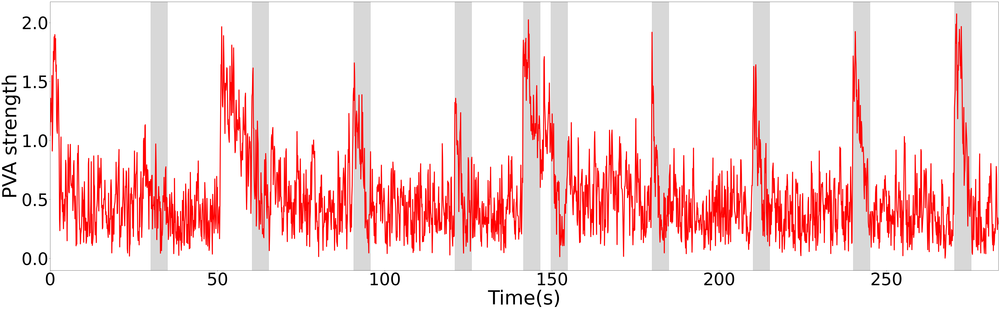

In [31]:
plt.figure(figsize= (70,20))
plt.plot(time_array_imaging,PVA_strength_normalized,color = 'r',linewidth =4)
# Step 1: Add shaded rectangles after post-stim indices (cut_indices)
for cut in cut_indices:
    start_time = (cut+1) * volume_time  
    end_time = start_time + 5  # Cover 10 seconds

    plt.axvspan(start_time, end_time, color='gray', alpha=0.3, label="Post-Stim Period" if cut == cut_indices[0] else "")

plt.xlabel('Time(s)', fontsize=80)
plt.xticks(fontsize=70)
plt.yticks(fontsize=70)
plt.xlim(0,volume_cycle_new *volume_time)
plt.ylabel('PVA strength', fontsize=80)
plt.show()

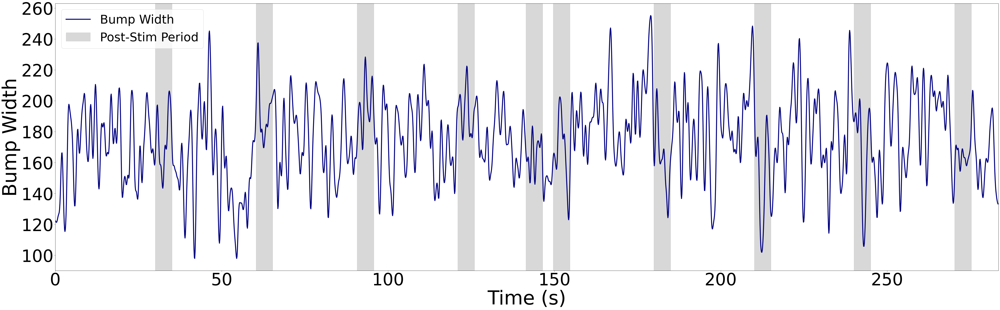

In [32]:
bump_width= calculateBumpWidth_v1(dF_F_array_8_roi_normalized,8)
bump_width_z= calculateBumpWidth_v1(Z_score_array_8_roi,8)
# Compute smoothed bump width
smoothed_bump_width = gaussian_filter1d(bump_width, sigma=3)

# Create the figure
plt.figure(figsize=(70, 20))

# Plot bump width
plt.plot(time_array_imaging, smoothed_bump_width, linewidth=4, color='navy', label="Bump Width")

# Step 1: Add shaded rectangles after post-stim indices (cut_indices)
for cut in cut_indices:
    start_time = (cut+1) * volume_time  
    end_time = start_time + 5  # Cover 10 seconds

    plt.axvspan(start_time, end_time, color='gray', alpha=0.3, label="Post-Stim Period" if cut == cut_indices[0] else "")

# Labels and axes formatting
plt.xlabel('Time (s)', fontsize=80)
plt.ylabel('Bump Width', fontsize=80)
plt.xticks(fontsize=70)
plt.yticks(fontsize=70)
plt.xlim(0, volume_cycle_new * volume_time)
plt.legend(fontsize=50)
plt.show()


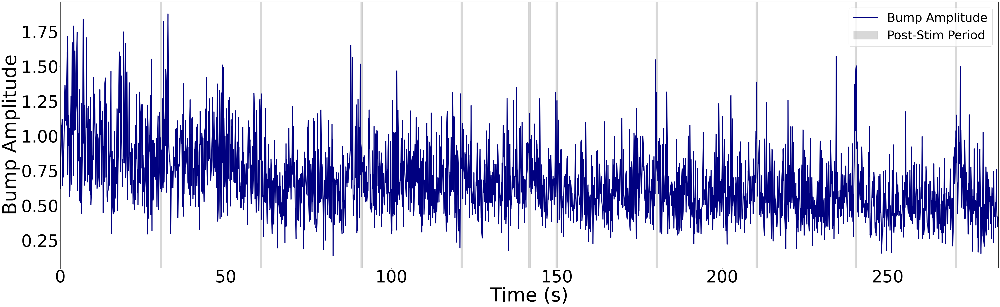

In [33]:
# Create the figure
plt.figure(figsize=(70, 20))

# Plot bump width
plt.plot(time_array_imaging, bump_amplitude_dff, linewidth=4, color='navy', label="Bump Amplitude")

# Step 1: Add shaded rectangles after post-stim indices (cut_indices)
for cut in cut_indices:
    start_time = (cut+1) * volume_time  
    end_time = start_time + 0.6

    plt.axvspan(start_time, end_time, color='gray', alpha=0.3, label="Post-Stim Period" if cut == cut_indices[0] else "")

# Labels and axes formatting
plt.xlabel('Time (s)', fontsize=80)
plt.ylabel('Bump Amplitude', fontsize=80)
plt.xticks(fontsize=70)
plt.yticks(fontsize=70)
plt.xlim(0, volume_cycle_new * volume_time)
plt.legend(fontsize=50)
plt.show()


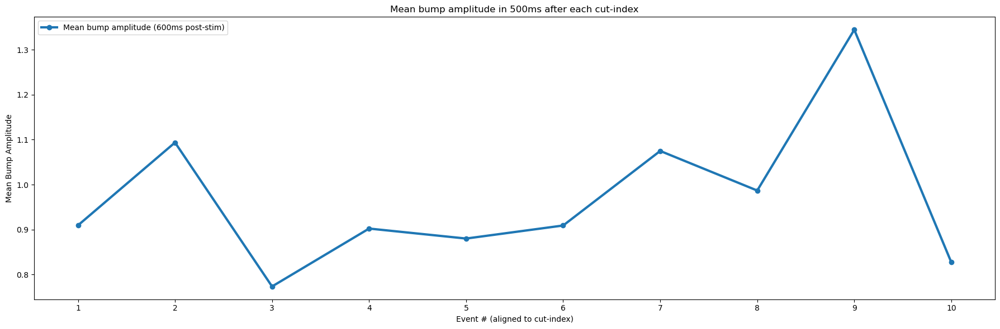

In [34]:
import numpy as np
import matplotlib.pyplot as plt

# --- Compute 1s-post-cut means ---
post_means = []
samples_per_window = []  # (optional) to inspect how many points went into each mean

for cut in cut_indices:
    start_time = (cut + 1) * volume_time
    end_time   = start_time + 0.5  # exactly 0.6 second after the cut

    # indices of samples within [start_time, end_time)
    mask = (time_array_imaging >= start_time) & (time_array_imaging < end_time)
    ywin = bump_amplitude_dff[mask]

    if ywin.size > 0 and np.isfinite(ywin).any():
        post_means.append(np.nanmean(ywin))
        samples_per_window.append(ywin.size)
    else:
        post_means.append(np.nan)   # no samples in this window → mark as NaN
        samples_per_window.append(0)

events = np.arange(1, len(cut_indices) + 1)

# --- Plot ---
plt.figure(figsize=(18, 6))
plt.plot(events, post_means, marker='o', linewidth=3, label='Mean bump amplitude (600ms post-stim)')
plt.xticks(events)  # x-axis ticks: 1..N
plt.xlabel('Event # (aligned to cut-index)')
plt.ylabel('Mean Bump Amplitude')
plt.title('Mean bump amplitude in 500ms after each cut-index')
plt.legend()
plt.tight_layout()
plt.show()

# (Optional) quick sanity print:
# for i, (m, n) in enumerate(zip(post_means, samples_per_window), start=1):
#     print(f"Event {i}: mean={m:.4g}, n={n}")


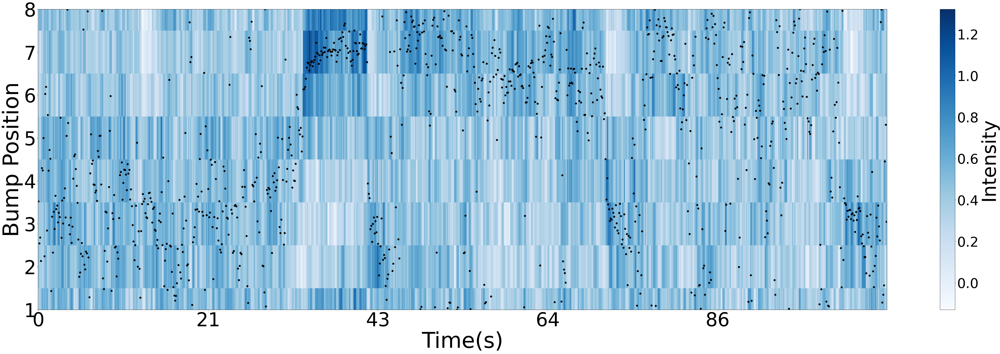

In [35]:
range_start =1000
range_end = 2000
a=plt.figure(figsize= (70,20))
img = plt.imshow(df_dff_in_ROI_normalized_shifted_for_plotting_part[:,range_start:range_end], aspect= 'auto', interpolation = 'none', cmap = 'Blues')
plt.xlabel('Time(s)', fontsize=80)
plt.ylabel('Bump Position', fontsize=80)
plt.xticks(ticks=plt.xticks()[0][0:], labels=np.array(plt.xticks()[0][0:]/volume_rate+ range_start*volume_time, dtype=np.int64), fontsize =70)
plt.xticks(ticks=plt.xticks()[0][0:], labels=np.array(plt.xticks()[0][0:]/volume_rate, dtype=np.int64), fontsize =70)
plt.yticks(ticks=plt.yticks()[0][0:], labels=np.array(plt.yticks()[0][0:]+1, dtype=np.int64), fontsize=70)
plt.scatter(np.arange(len(PVA_angle_Array_normalized[range_start:range_end])),7*(PVA_angle_Array_normalized[range_start:range_end]+180)/2/180, color ='black', s = 40)
plt.ylim(0,7)
plt.locator_params(axis ='x',nbins = 20)


cbar = plt.colorbar(img)
cbar.set_label('Intensity',fontsize = 70)
cbar.ax.tick_params(labelsize = 50)

plt.show()

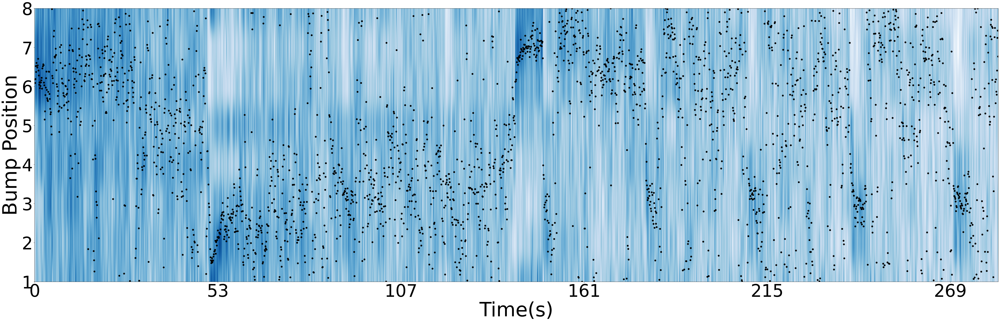

In [36]:
#Plot heatmap of signals in combined ROI and superimpose with PVA
Z_score_array_8_roi = Z_score_array_8_roi.transpose()
Z_score_array_8_roi_shifted = np.zeros((np.size(df_dff_in_ROI_normalized,0),np.size(df_dff_in_ROI_normalized,1)))
Z_score_array_8_roi_shifted[0,:] = Z_score_array_8_roi[4,:]
Z_score_array_8_roi_shifted[1,:] = Z_score_array_8_roi[5,:]
Z_score_array_8_roi_shifted[2,:] = Z_score_array_8_roi[6,:]
Z_score_array_8_roi_shifted[3,:] = Z_score_array_8_roi[7,:] 
Z_score_array_8_roi_shifted[4,:] = Z_score_array_8_roi[0,:] 
Z_score_array_8_roi_shifted[5,:] = Z_score_array_8_roi[1,:] 
Z_score_array_8_roi_shifted[6,:] = Z_score_array_8_roi[2,:] 
Z_score_array_8_roi_shifted[7,:] = Z_score_array_8_roi[3,:]
Z_score_array_8_roi_shifted = pd.DataFrame(Z_score_array_8_roi_shifted)
plt.figure(figsize= (70,20))
plt.imshow(Z_score_array_8_roi_shifted, aspect= 'auto', cmap = 'Blues')
plt.xlabel('Time(s)', fontsize=80)
plt.ylabel('Bump Position', fontsize=80)
plt.xticks(ticks=plt.xticks()[0][0:], labels=np.array(plt.xticks()[0][0:]/volume_rate, dtype=np.int64), fontsize =70)
plt.yticks(ticks=plt.yticks()[0][0:], labels=np.array(plt.yticks()[0][0:]+1, dtype=np.int64), fontsize=70)
plt.ylim(0,7)
plt.locator_params(axis ='x',nbins = 20)
plt.scatter(np.arange(len(PVA_angle_array_z)),7*(PVA_angle_array_z+180)/2/180, color ='black', s = 40)
plt.show()

In [37]:
Z_score_array_8_roi = Z_score_array_8_roi.transpose()

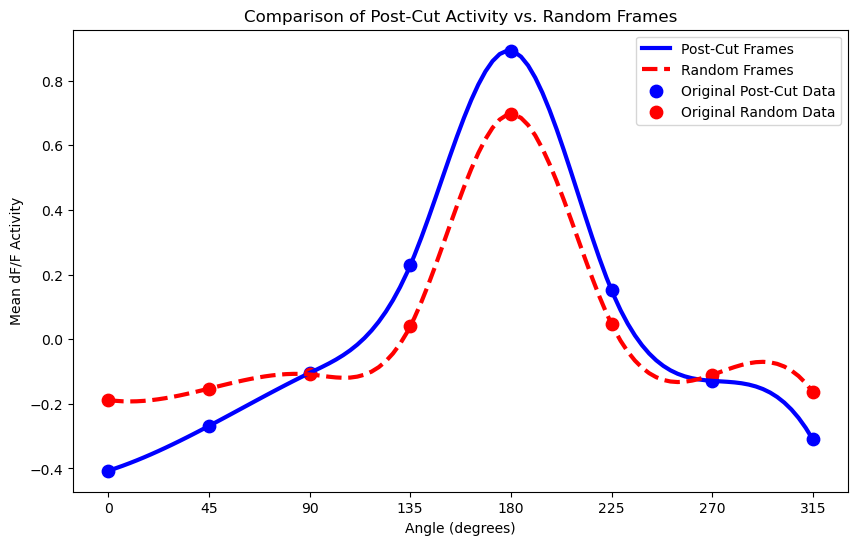

Mean FWHM of Post-Cut Distribution: 170.40 degrees
Mean FWHM of Random Distribution: 178.50 degrees


In [38]:
df_dff_shifted, post_cut_mean, random_mean, post_cut_fwhm, random_fwhm = analyze_peak_shifted_activity(
    df_dff_signal=Z_score_array_8_roi_shifted,
    bump_width=bump_width_z,
    cut_indices=cut_indices,
    roi_to_degrees = 45,
    peak_center_index = 4,
    plot_results=True  # Enable plotting
)

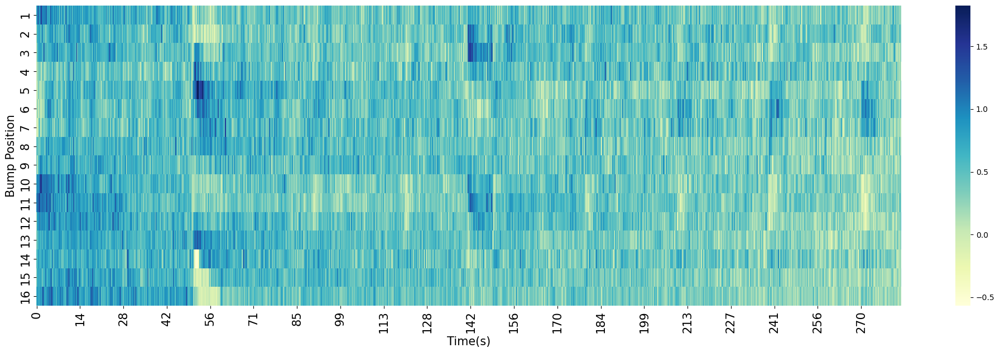

In [39]:
#Plot uncombined 16/8 ROi all together
plt.figure(figsize= (25,7))
time_array_imaging_round = np.round_(time_array_imaging, decimals =0)
p16 = sns.heatmap(dF_F_array_normalized.transpose(),cmap='YlGnBu', xticklabels = time_array_imaging_round)
sns.color_palette("light:b", as_cmap=True)
plt.xticks(ticks=plt.xticks()[0][0:], labels=np.array(plt.xticks()[0][0:]/volume_rate, dtype=np.int64), fontsize =15)
plt.yticks(ticks=plt.yticks()[0][0:], labels=np.array(plt.yticks()[0][0:]+1, dtype=np.int64), fontsize=15)
plt.locator_params(axis ='x',nbins = 20)
plt.xlabel('Time(s)', fontsize=15)
plt.ylabel('Bump Position', fontsize=15)
plt.show()

In [40]:
PVA_behavior_data_output_normalized = pd.DataFrame()
PVA_behavior_data_output_normalized['Time_Stamp'] = time_array_imaging
PVA_behavior_data_output_normalized['F_Roi_1'] = F_8_roi[:,0]
PVA_behavior_data_output_normalized['F_Roi_2'] = F_8_roi[:,1]
PVA_behavior_data_output_normalized['F_Roi_3'] = F_8_roi[:,2]
PVA_behavior_data_output_normalized['F_Roi_4'] = F_8_roi[:,3]
PVA_behavior_data_output_normalized['F_Roi_5'] = F_8_roi[:,4]
PVA_behavior_data_output_normalized['F_Roi_6'] = F_8_roi[:,5]
PVA_behavior_data_output_normalized['F_Roi_7'] = F_8_roi[:,6]
PVA_behavior_data_output_normalized['F_Roi_8'] = F_8_roi[:,7]
PVA_behavior_data_output_normalized['Raw_F_1'] = F_array_stimulation_period_removed[:,0]
PVA_behavior_data_output_normalized['Raw_F_2'] = F_array_stimulation_period_removed[:,1]
PVA_behavior_data_output_normalized['Raw_F_3'] = F_array_stimulation_period_removed[:,2]
PVA_behavior_data_output_normalized['Raw_F_4'] = F_array_stimulation_period_removed[:,3]
PVA_behavior_data_output_normalized['Raw_F_5'] = F_array_stimulation_period_removed[:,4]
PVA_behavior_data_output_normalized['Raw_F_6'] = F_array_stimulation_period_removed[:,5]
PVA_behavior_data_output_normalized['Raw_F_7'] = F_array_stimulation_period_removed[:,6]
PVA_behavior_data_output_normalized['Raw_F_8'] = F_array_stimulation_period_removed[:,7]
if ROI_total == 16:
    PVA_behavior_data_output_normalized['Raw_F_9'] = F_array_stimulation_period_removed[:,8]
    PVA_behavior_data_output_normalized['Raw_F_10'] = F_array_stimulation_period_removed[:,9]
    PVA_behavior_data_output_normalized['Raw_F_11'] = F_array_stimulation_period_removed[:,10]
    PVA_behavior_data_output_normalized['Raw_F_12'] = F_array_stimulation_period_removed[:,11]
    PVA_behavior_data_output_normalized['Raw_F_13'] = F_array_stimulation_period_removed[:,12]
    PVA_behavior_data_output_normalized['Raw_F_14'] = F_array_stimulation_period_removed[:,13]
    PVA_behavior_data_output_normalized['Raw_F_15'] = F_array_stimulation_period_removed[:,14]
    PVA_behavior_data_output_normalized['Raw_F_16'] = F_array_stimulation_period_removed[:,15]
PVA_behavior_data_output_normalized['dFF_Roi_1'] = dF_F_array_8_roi_normalized[:,0]
PVA_behavior_data_output_normalized['dFF_Roi_2'] = dF_F_array_8_roi_normalized[:,1]
PVA_behavior_data_output_normalized['dFF_Roi_3'] = dF_F_array_8_roi_normalized[:,2]
PVA_behavior_data_output_normalized['dFF_Roi_4'] = dF_F_array_8_roi_normalized[:,3]
PVA_behavior_data_output_normalized['dFF_Roi_5'] = dF_F_array_8_roi_normalized[:,4]
PVA_behavior_data_output_normalized['dFF_Roi_6'] = dF_F_array_8_roi_normalized[:,5]
PVA_behavior_data_output_normalized['dFF_Roi_7'] = dF_F_array_8_roi_normalized[:,6]
PVA_behavior_data_output_normalized['dFF_Roi_8'] = dF_F_array_8_roi_normalized[:,7]
PVA_behavior_data_output_normalized['Z_score_Roi_1'] = Z_score_array_8_roi[:,0]
PVA_behavior_data_output_normalized['Z_score_Roi_2'] = Z_score_array_8_roi[:,1]
PVA_behavior_data_output_normalized['Z_score_Roi_3'] = Z_score_array_8_roi[:,2]
PVA_behavior_data_output_normalized['Z_score_Roi_4'] = Z_score_array_8_roi[:,3]
PVA_behavior_data_output_normalized['Z_score_Roi_5'] = Z_score_array_8_roi[:,4]
PVA_behavior_data_output_normalized['Z_score_Roi_6'] = Z_score_array_8_roi[:,5]
PVA_behavior_data_output_normalized['Z_score_Roi_7'] = Z_score_array_8_roi[:,6]
PVA_behavior_data_output_normalized['Z_score_Roi_8'] = Z_score_array_8_roi[:,7]
PVA_behavior_data_output_normalized['PVA_Radian'] = PVA_radian_array_normalized
PVA_behavior_data_output_normalized['PVA_Angle'] = PVA_angle_Array_normalized
PVA_behavior_data_output_normalized['PVA_strength'] = PVA_strength_normalized
PVA_behavior_data_output_normalized['Bump_amplitude_max_min'] = bump_amplitude_dff_normalized
PVA_behavior_data_output_normalized['Bump_amplitude_PVA'] = bump_amplitude_dff_normalized_v3
PVA_behavior_data_output_normalized['Bump_width'] = bump_width

In [41]:
# Define file paths
output_file = "/home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R60D05_syt7f/TQfly773-004.npz"
tif_file_path = "/home/tianhaoqiu/Documents/GitHub/2p_analysis/napari_roi/EPG_write_in/Power curve/R60D05_lexopCsCHtdT_R60D05_syt7f/TQfly773/ROI_16_TQfly773-004.tif"  # Change this to your actual TIFF file path

# Convert Pandas DataFrame to a dictionary of NumPy arrays
data_dict = {col: PVA_behavior_data_output_normalized[col].values for col in PVA_behavior_data_output_normalized.columns}

# Add the cut_indices array
data_dict["post_stim_frame"] = np.array(cut_indices)  # Ensure it's a NumPy array

# Read the TIFF file as a NumPy array
tif_image = tifffile.imread(tif_file_path)  # Load TIFF file

# Add the TIFF image to the dictionary
data_dict["ROI_16"] = tif_image  # Store the TIFF as an array in the .npz file

# Save everything in a .npz file
np.savez(output_file, **data_dict)

print(f"Data and TIFF image saved successfully as {output_file}")

Data and TIFF image saved successfully as /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R60D05_syt7f/TQfly773-004.npz


# Pooled Group Analysis

Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly753-001.npz


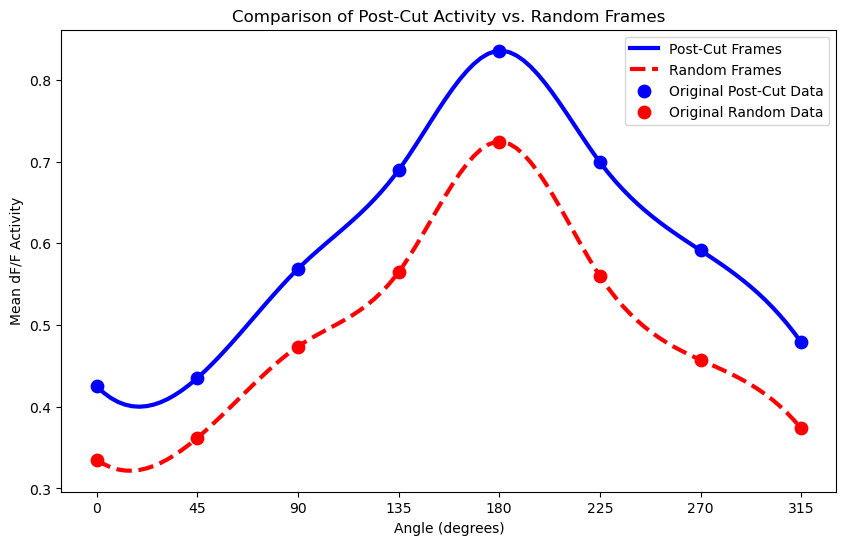

Mean FWHM of Post-Cut Distribution: 182.67 degrees
Mean FWHM of Random Distribution: 191.70 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly752-004.npz


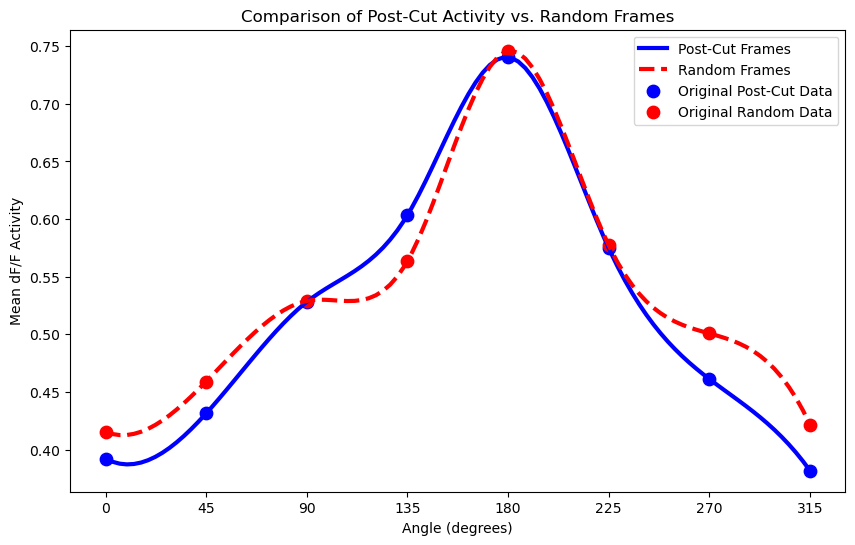

Mean FWHM of Post-Cut Distribution: 187.83 degrees
Mean FWHM of Random Distribution: 180.00 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly754-004.npz


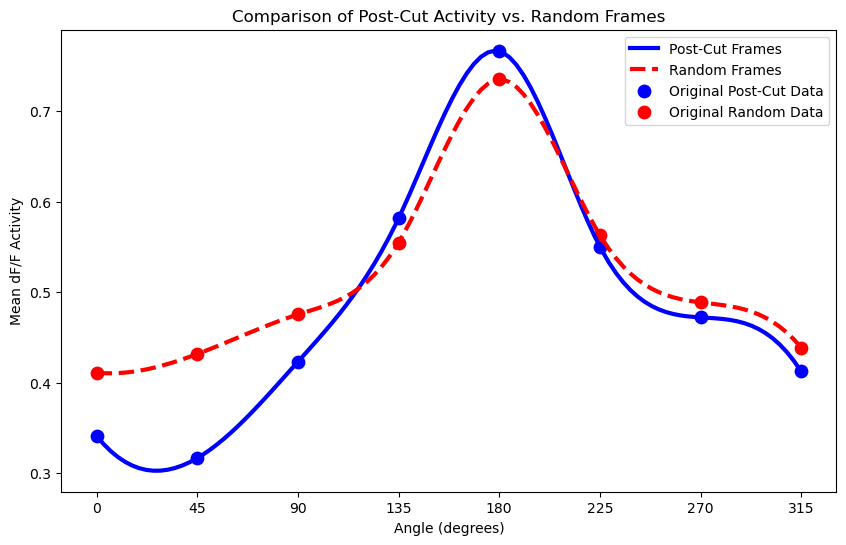

Mean FWHM of Post-Cut Distribution: 189.00 degrees
Mean FWHM of Random Distribution: 182.55 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly752-001.npz


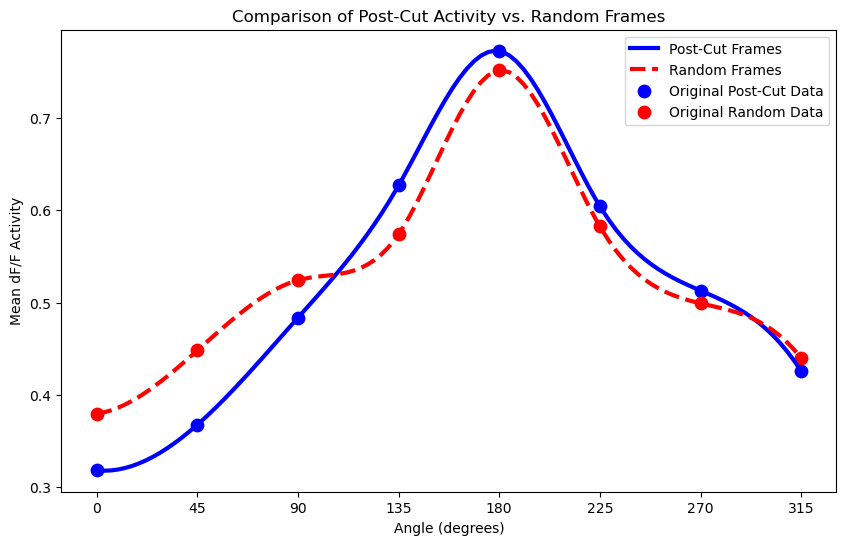

Mean FWHM of Post-Cut Distribution: 197.17 degrees
Mean FWHM of Random Distribution: 184.35 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly751-004.npz


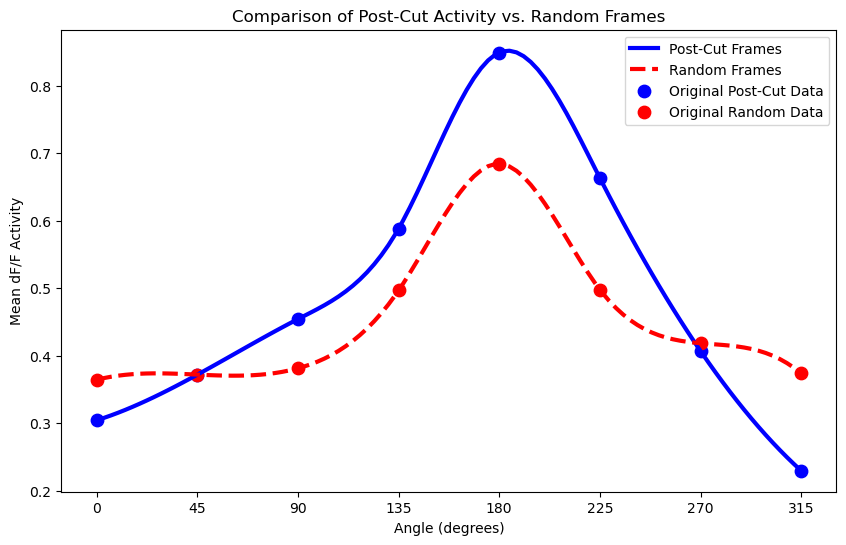

Mean FWHM of Post-Cut Distribution: 168.83 degrees
Mean FWHM of Random Distribution: 170.25 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly753-002.npz


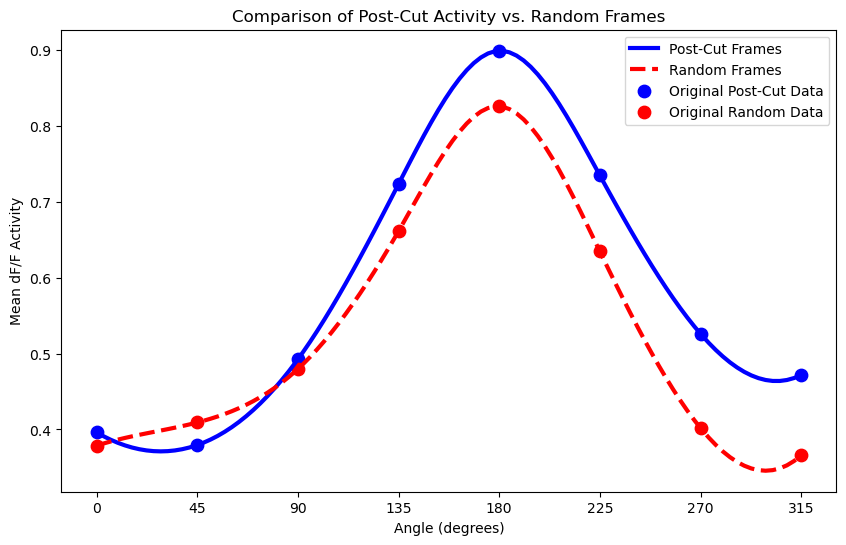

Mean FWHM of Post-Cut Distribution: 189.00 degrees
Mean FWHM of Random Distribution: 193.65 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly754-003.npz


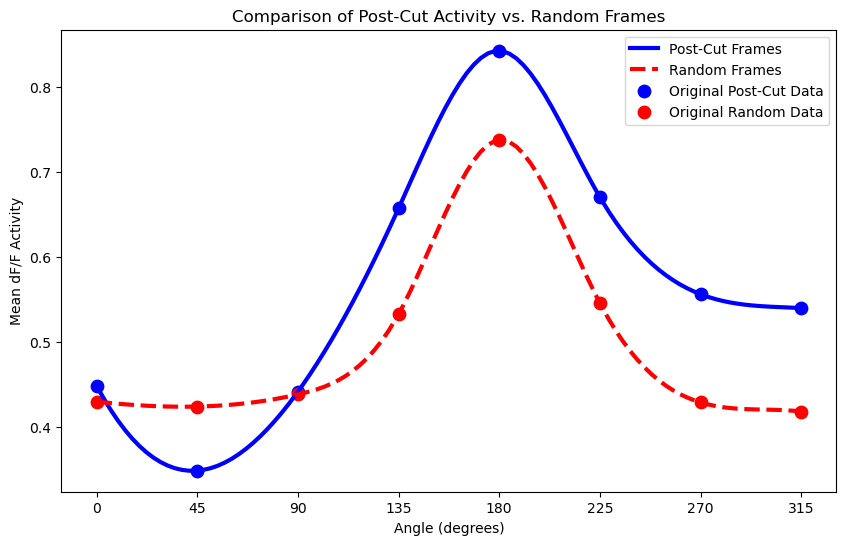

Mean FWHM of Post-Cut Distribution: 194.17 degrees
Mean FWHM of Random Distribution: 181.35 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly751-001.npz


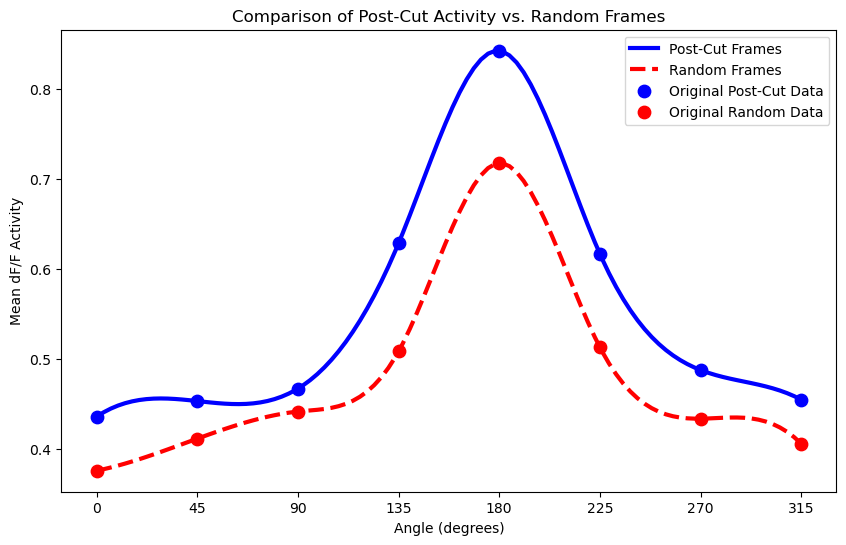

Mean FWHM of Post-Cut Distribution: 167.67 degrees
Mean FWHM of Random Distribution: 171.60 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly754-002.npz


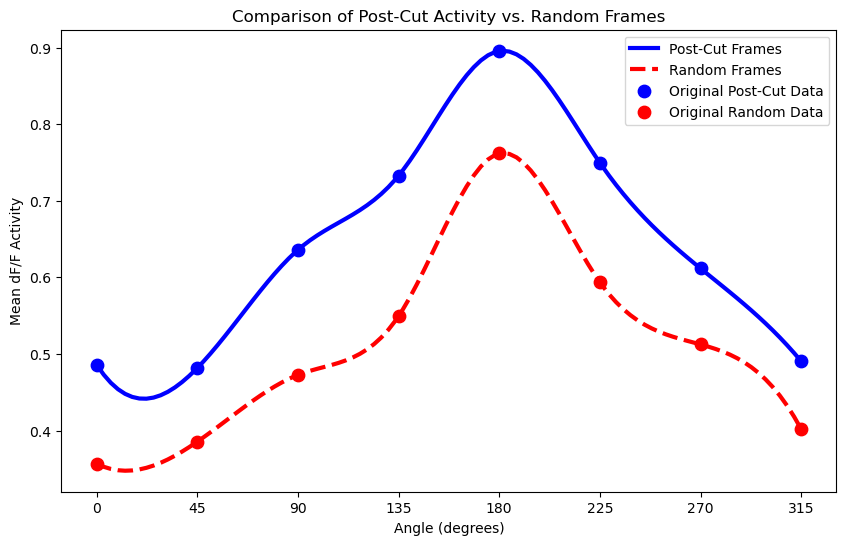

Mean FWHM of Post-Cut Distribution: 188.33 degrees
Mean FWHM of Random Distribution: 175.20 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly753-004.npz


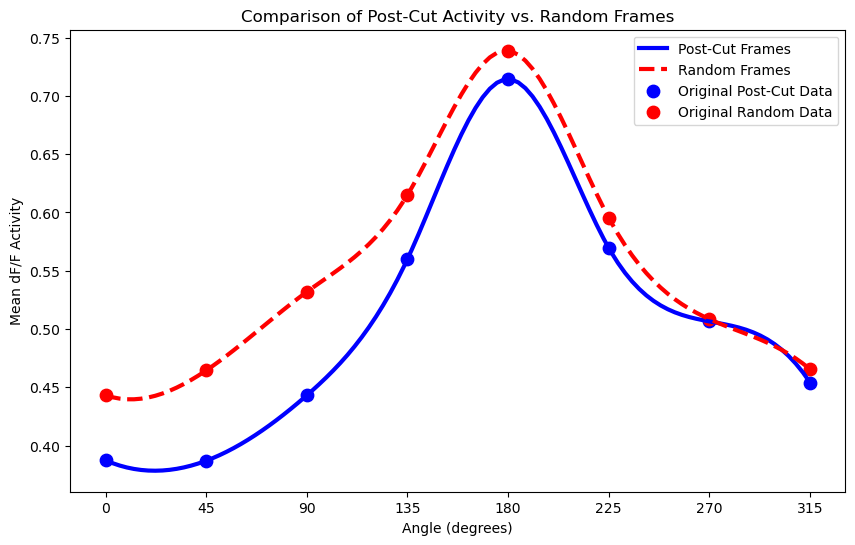

Mean FWHM of Post-Cut Distribution: 189.17 degrees
Mean FWHM of Random Distribution: 180.75 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly752-002.npz


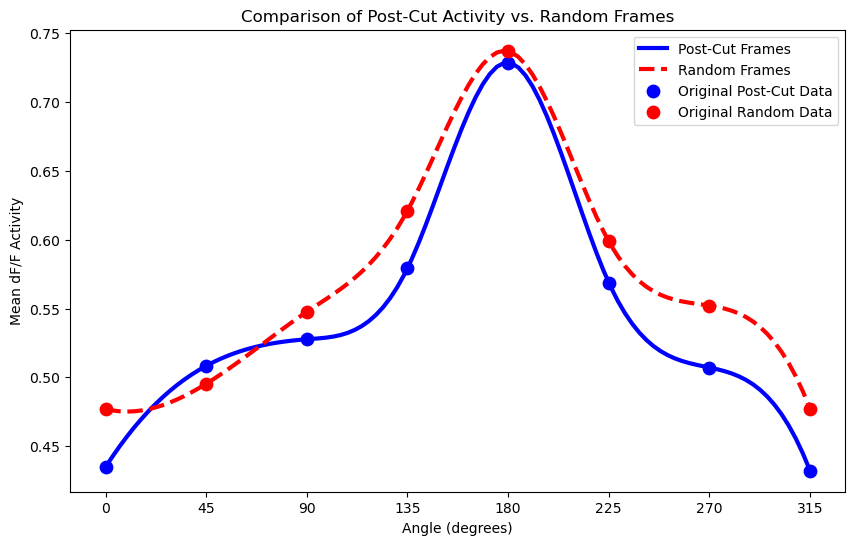

Mean FWHM of Post-Cut Distribution: 188.67 degrees
Mean FWHM of Random Distribution: 173.40 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly751-003.npz


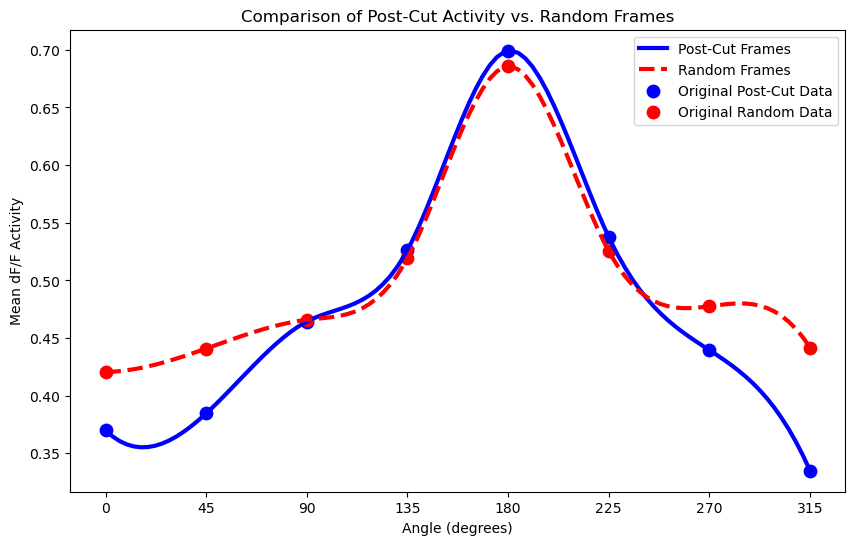

Mean FWHM of Post-Cut Distribution: 171.50 degrees
Mean FWHM of Random Distribution: 183.15 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly754-001.npz


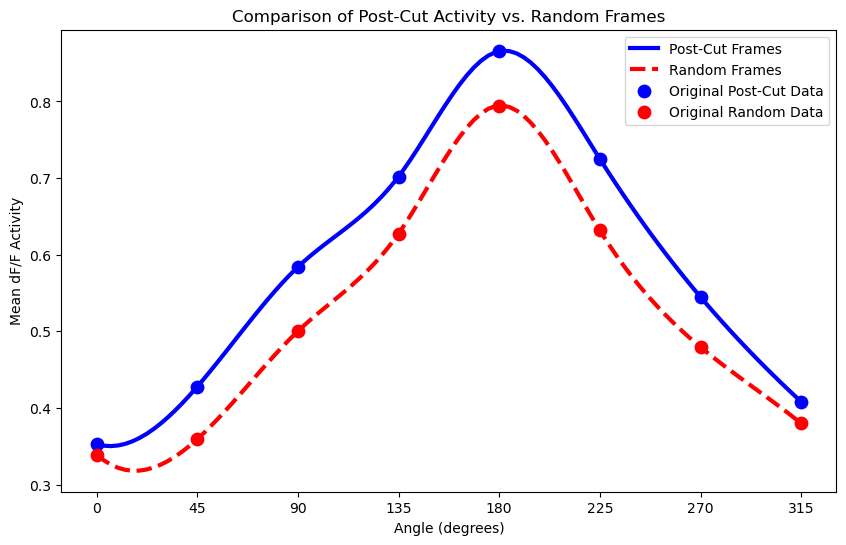

Mean FWHM of Post-Cut Distribution: 193.17 degrees
Mean FWHM of Random Distribution: 181.50 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly753-003.npz


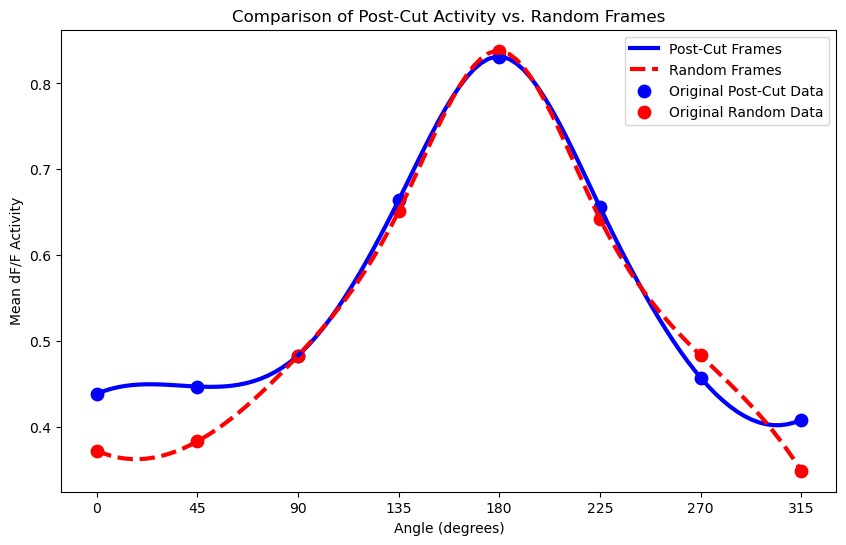

Mean FWHM of Post-Cut Distribution: 189.67 degrees
Mean FWHM of Random Distribution: 192.75 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly751-002.npz


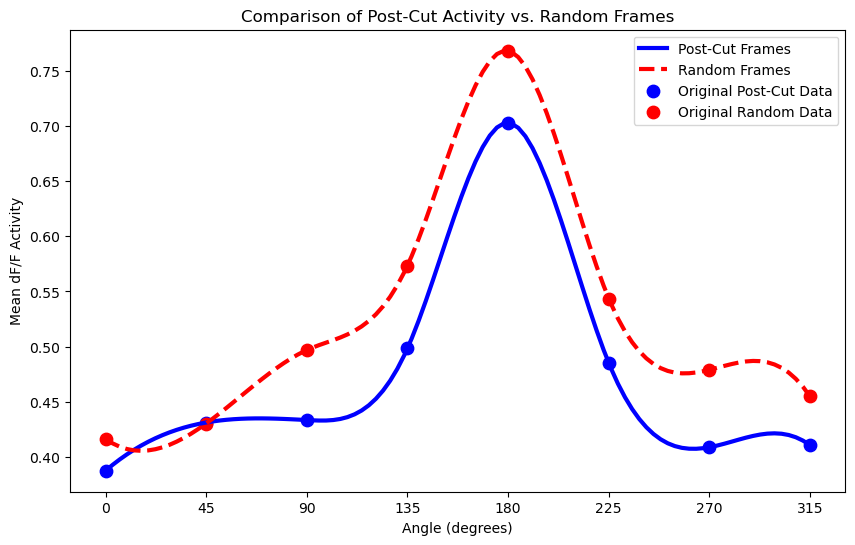

Mean FWHM of Post-Cut Distribution: 182.00 degrees
Mean FWHM of Random Distribution: 174.45 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly752-003.npz


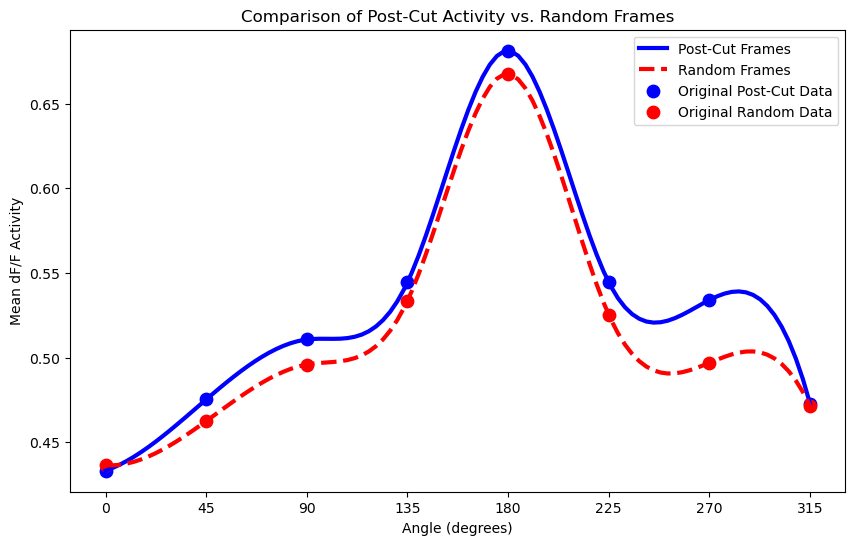

Mean FWHM of Post-Cut Distribution: 197.67 degrees
Mean FWHM of Random Distribution: 188.85 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly753-001.npz


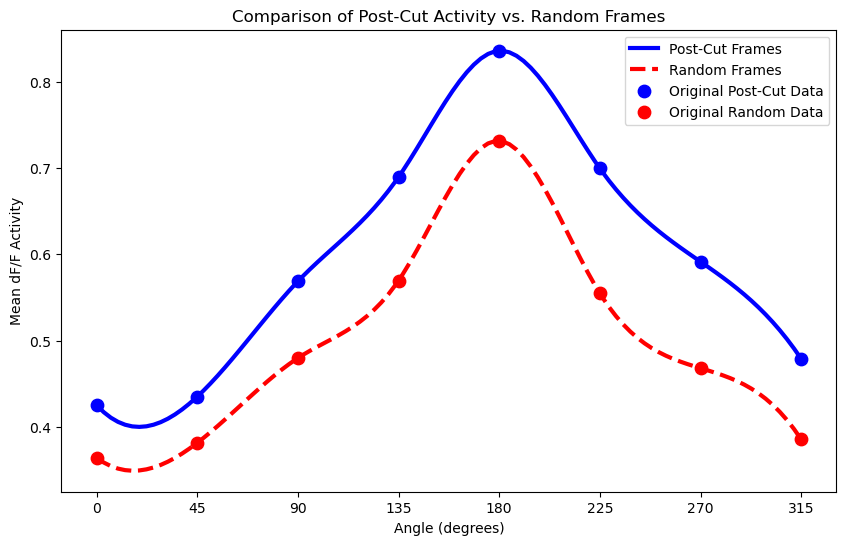

Mean FWHM of Post-Cut Distribution: 182.67 degrees
Mean FWHM of Random Distribution: 185.40 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly752-004.npz


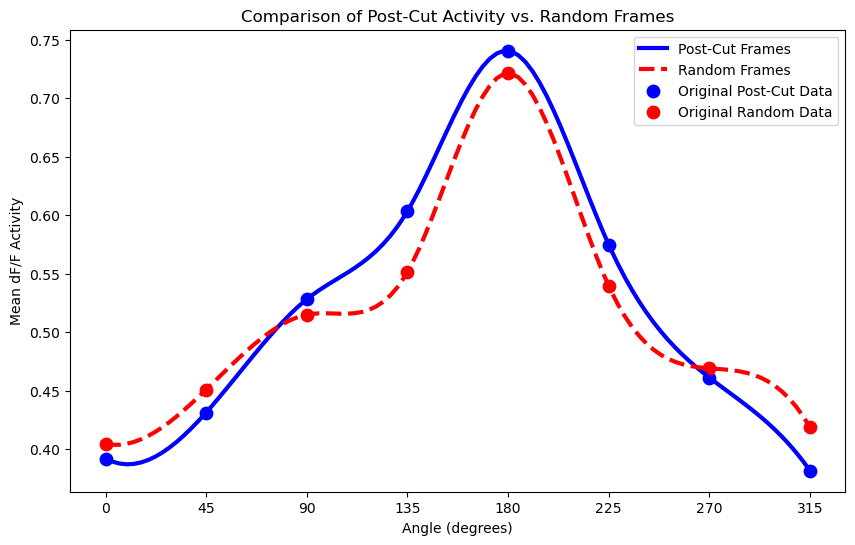

Mean FWHM of Post-Cut Distribution: 187.83 degrees
Mean FWHM of Random Distribution: 181.95 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly754-004.npz


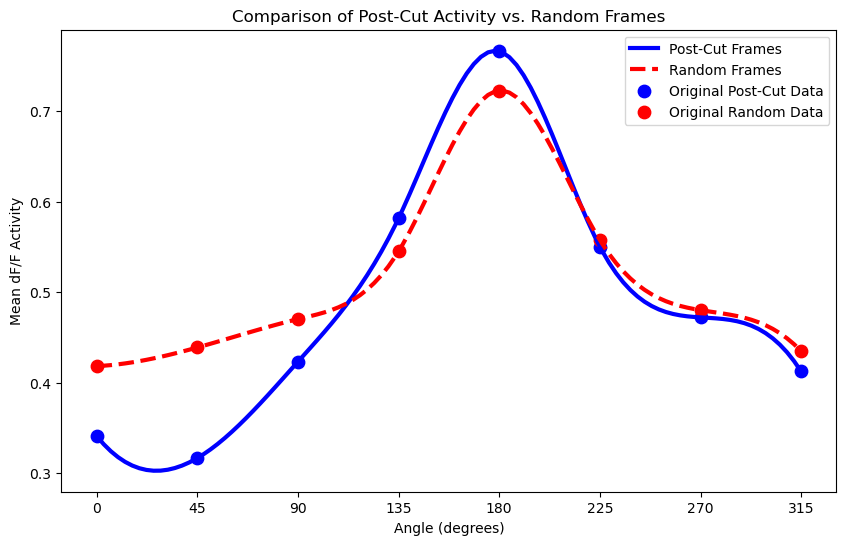

Mean FWHM of Post-Cut Distribution: 189.00 degrees
Mean FWHM of Random Distribution: 188.10 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly752-001.npz


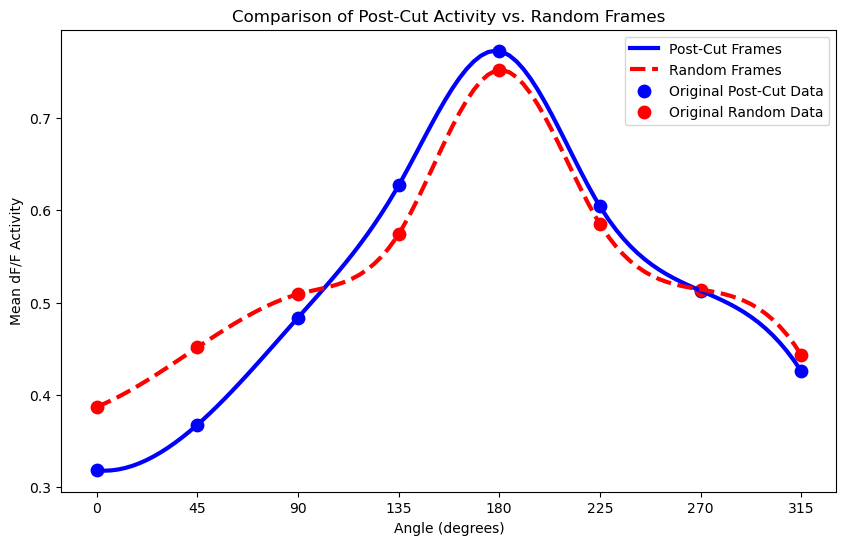

Mean FWHM of Post-Cut Distribution: 197.17 degrees
Mean FWHM of Random Distribution: 186.60 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly751-004.npz


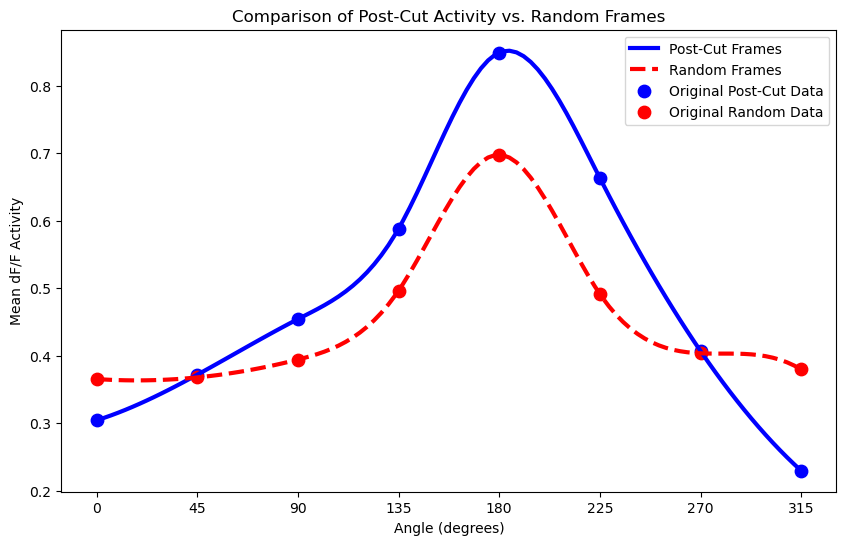

Mean FWHM of Post-Cut Distribution: 168.83 degrees
Mean FWHM of Random Distribution: 161.40 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly753-002.npz


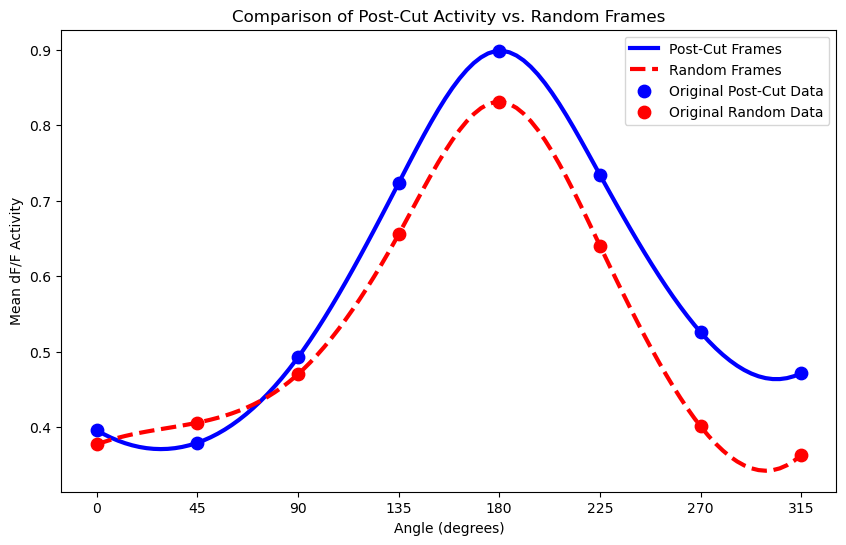

Mean FWHM of Post-Cut Distribution: 189.00 degrees
Mean FWHM of Random Distribution: 196.50 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly754-003.npz


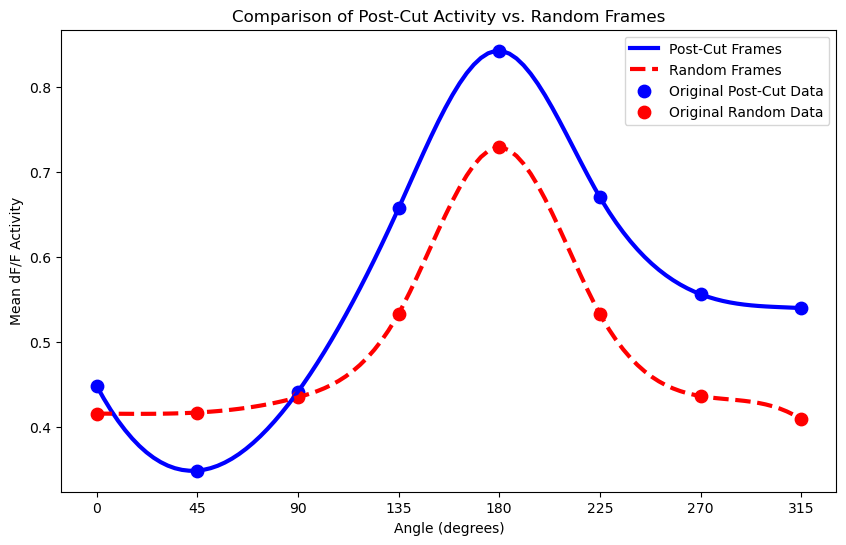

Mean FWHM of Post-Cut Distribution: 194.17 degrees
Mean FWHM of Random Distribution: 190.95 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly751-001.npz


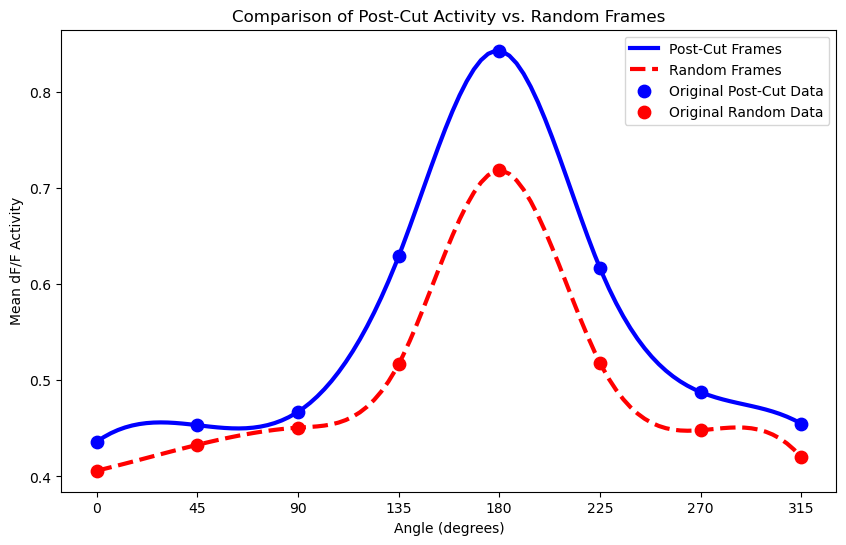

Mean FWHM of Post-Cut Distribution: 167.67 degrees
Mean FWHM of Random Distribution: 175.80 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly754-002.npz


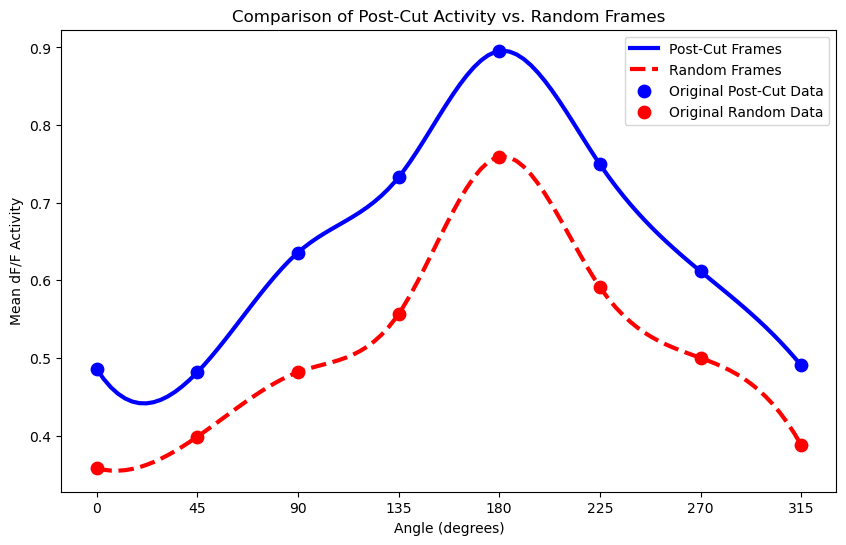

Mean FWHM of Post-Cut Distribution: 188.33 degrees
Mean FWHM of Random Distribution: 176.85 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly753-004.npz


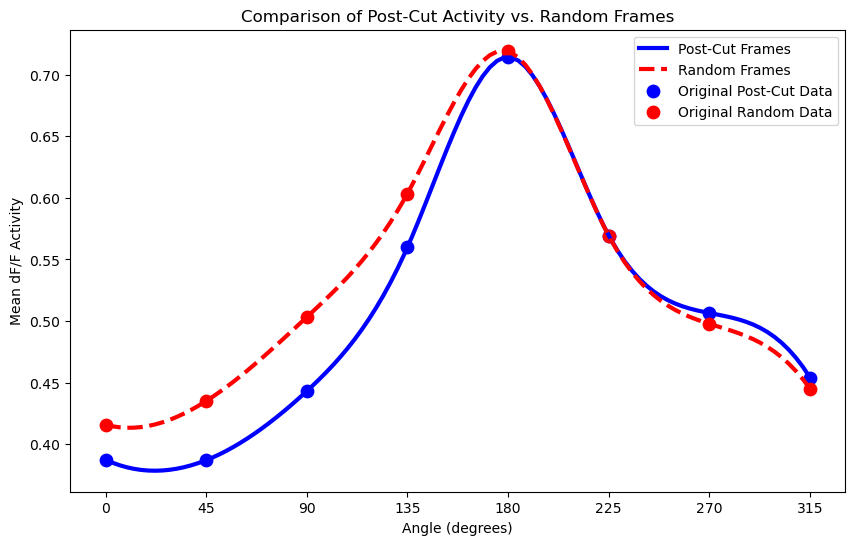

Mean FWHM of Post-Cut Distribution: 189.17 degrees
Mean FWHM of Random Distribution: 173.40 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly752-002.npz


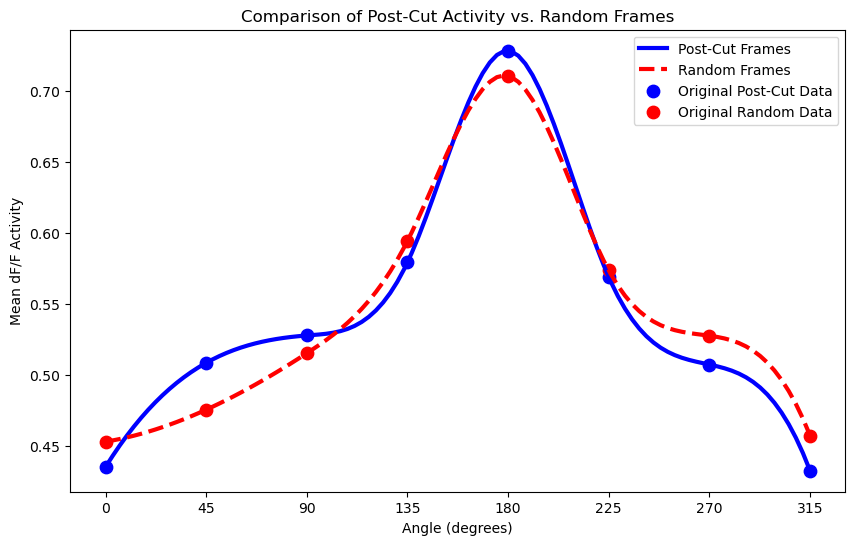

Mean FWHM of Post-Cut Distribution: 188.67 degrees
Mean FWHM of Random Distribution: 175.35 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly751-003.npz


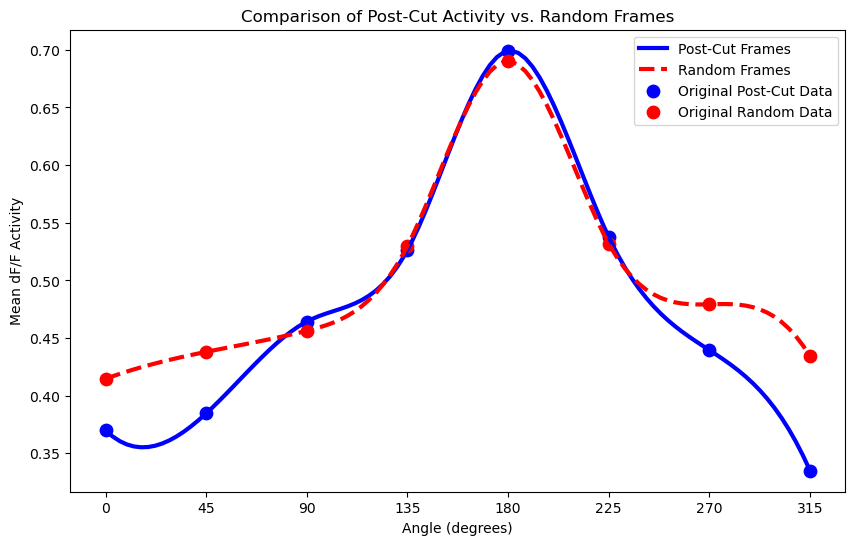

Mean FWHM of Post-Cut Distribution: 171.50 degrees
Mean FWHM of Random Distribution: 177.15 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly754-001.npz


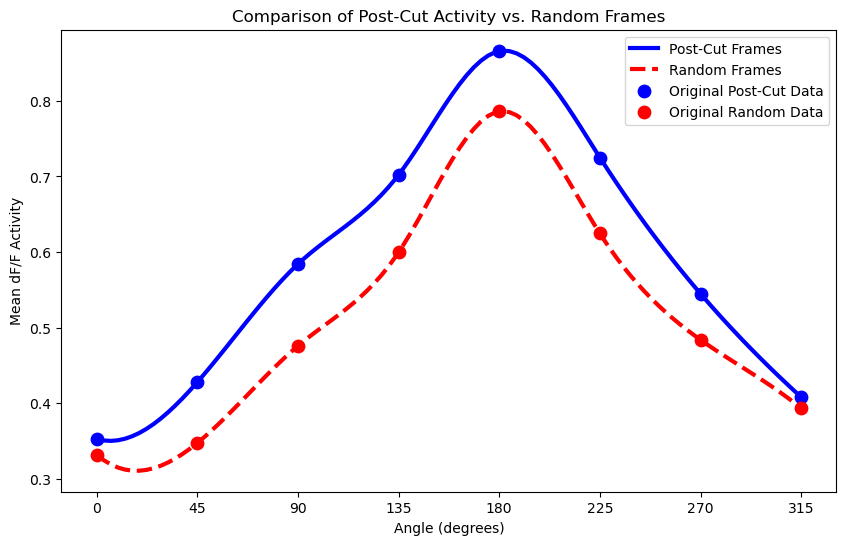

Mean FWHM of Post-Cut Distribution: 193.17 degrees
Mean FWHM of Random Distribution: 184.80 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly753-003.npz


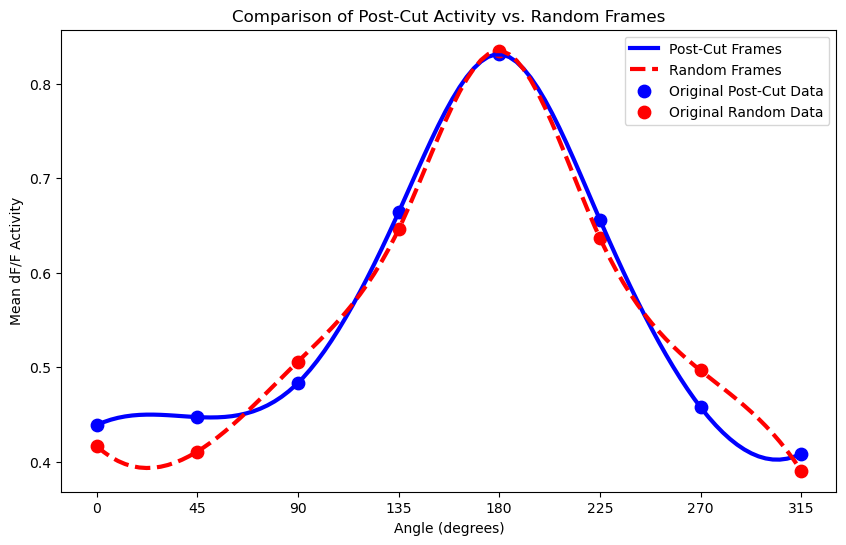

Mean FWHM of Post-Cut Distribution: 189.67 degrees
Mean FWHM of Random Distribution: 185.70 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly751-002.npz


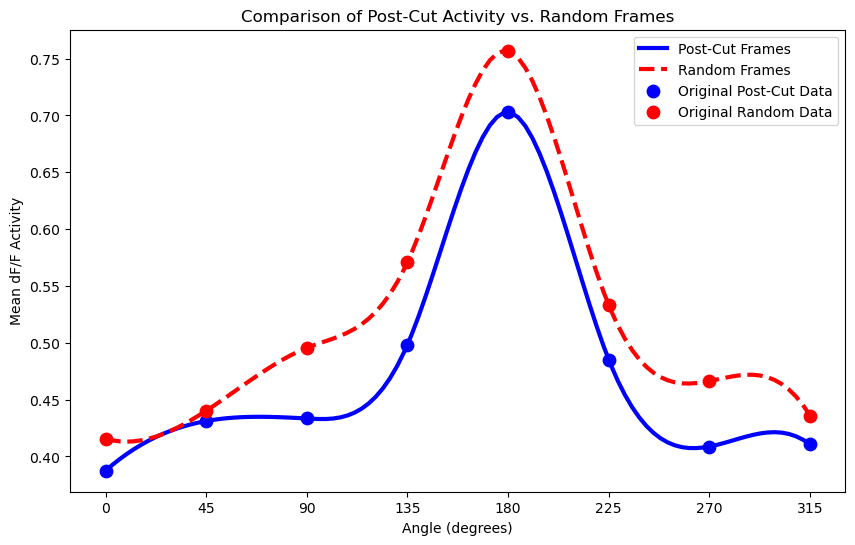

Mean FWHM of Post-Cut Distribution: 182.00 degrees
Mean FWHM of Random Distribution: 173.55 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f/TQfly752-003.npz


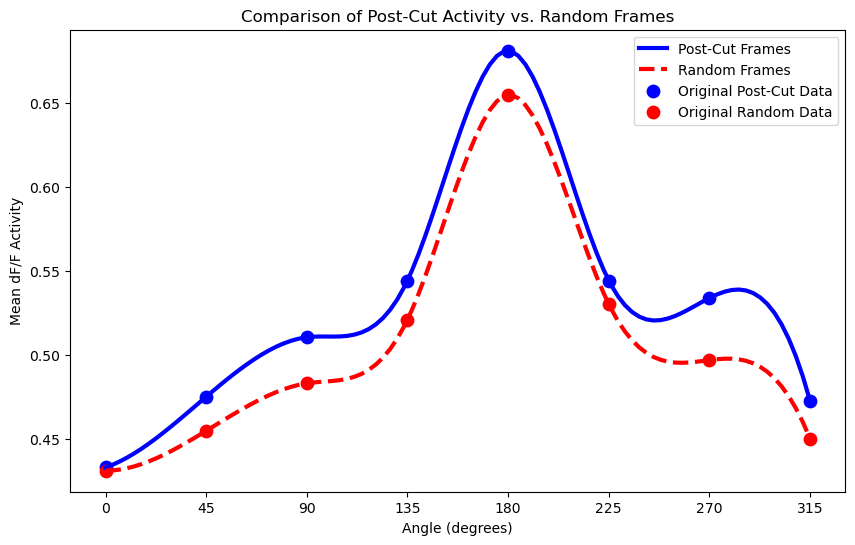

Mean FWHM of Post-Cut Distribution: 197.67 degrees
Mean FWHM of Random Distribution: 188.40 degrees


In [47]:
# Run analysis for each group
folder_group1 = "/home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f"  # Replace with actual path
folder_group2 = "/home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f"  # Replace with actual path


# Get results for each group
group1_post_mean_activity, group1_random_mean_activity, group1_mean_post, group1_mean_random  = process_group(folder_group1)
group2_post_mean_activity, group2_random_mean_activity, group2_mean_post, group2_mean_random  = process_group(folder_group2)

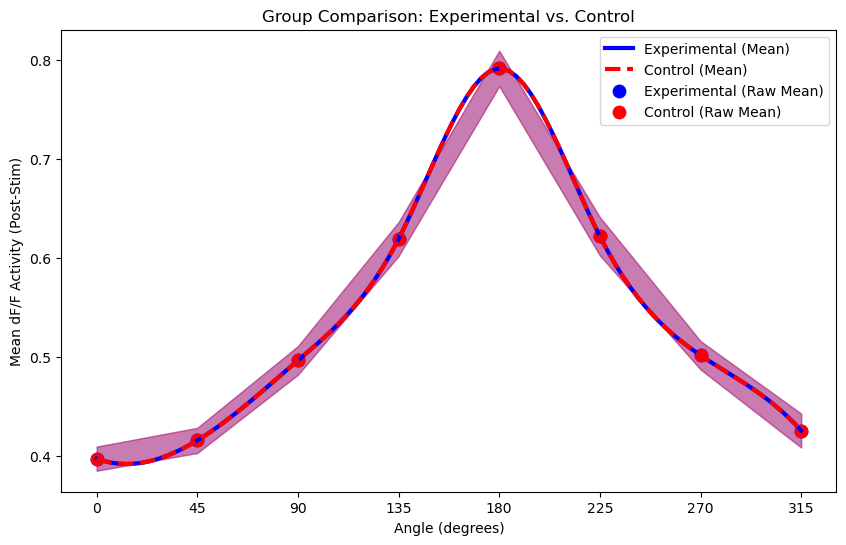

In [49]:
plot_group_comparison(
    roi_to_degrees=45,
    group1_data=group1_post_mean_activity,  # Only post-stim mean activity
    group2_data=group2_post_mean_activity,  # Only post-stim mean activity
    group1_label="Experimental",
    group2_label="Control"
)

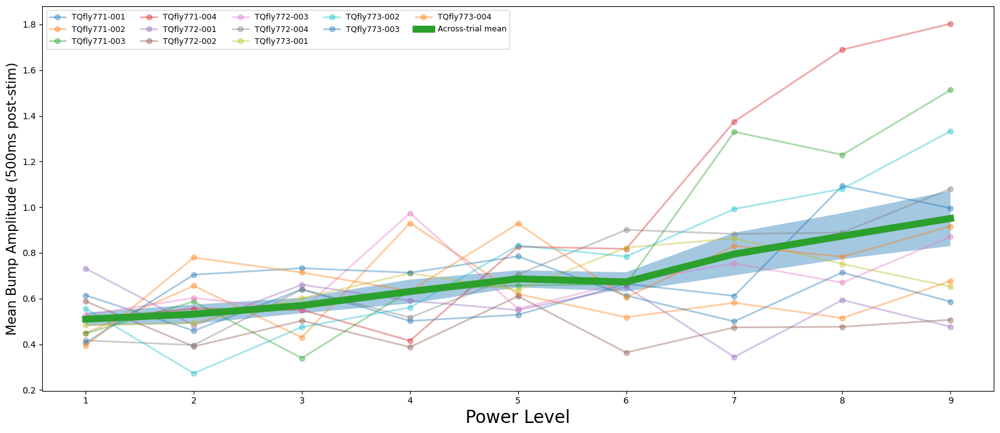

Pooled table saved to: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R60D05_syt7f/pooled_post1s_means.csv


In [48]:
import os, glob, re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---------------------- Config ----------------------
data_dir = "/home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R60D05_syt7f"
pattern  = os.path.join(data_dir, "*.npz")   # load all trials saved there
metric_keys_priority = ["Bump_amplitude_max_min"]  # pick first that exists
#metric_keys_priority = ["Bump_amplitude_PVA"]  # pick first that exists
window_seconds = 0.5                        # exactly 1s after each cut-index
max_events = 9                               # plot 9 events as requested
# ----------------------------------------------------

def _trial_id_from_path(path):
    # Extract something like "TQfly751-004" from the filename if present
    base = os.path.basename(path)
    m = re.search(r"([A-Za-z0-9_-]+)\.npz$", base)
    return m.group(1) if m else base

def load_trial_npz(path):
    """Load one trial and return (trial_id, time, signal, cuts)."""
    z = np.load(path, allow_pickle=True)
    # Required keys
    time = z["Time_Stamp"]
    cuts = z["post_stim_frame"]

    # Choose a metric to use
    metric_key = None
    for k in metric_keys_priority:
        if k in z.files:
            metric_key = k
            break
    if metric_key is None:
        raise KeyError(f"No bump amplitude key found in {path}. "
                       f"Tried: {metric_keys_priority}")

    signal = z[metric_key]
    trial_id = _trial_id_from_path(path)
    return trial_id, time, signal, cuts

def compute_post_means_1s(time, signal, cuts, window=1.0):
    """
    For each cut index, take the 1s window immediately after the *next frame*:
      start = time[c+1]   (if c+1 in range)
      end   = start + 1s
    Return vector of per-event means (NaN if out-of-range or empty window).
    """
    means = []
    counts = []
    n = time.shape[0]

    # Ensure time is strictly increasing (if not, argsort to be safe)
    if not np.all(np.diff(time) >= 0):
        order = np.argsort(time)
        time = time[order]
        signal = np.asarray(signal)[order]

    for c in cuts:
        # Start just after the cut frame
        if (c + 1) >= n:
            means.append(np.nan); counts.append(0); continue
        start = time[c + 1]
        end   = start + window

        mask = (time >= start) & (time < end)
        ywin = signal[mask]

        if ywin.size > 0 and np.isfinite(ywin).any():
            means.append(np.nanmean(ywin))
            counts.append(ywin.size)
        else:
            means.append(np.nan)
            counts.append(0)

    return np.asarray(means, float), np.asarray(counts, int)

# ----------- Load all trials and compute per-event means -----------
files = sorted(glob.glob(pattern))
if len(files) == 0:
    raise FileNotFoundError(f"No .npz files found at: {pattern}")

trial_rows = []       # for pooled tidy dataframe
per_trial_means = []  # list of arrays (length = num events per trial)
trial_labels = []     # for plotting legend

for fp in files:
    trial_id, time, signal, cuts = load_trial_npz(fp)
    means, counts = compute_post_means_1s(time, signal, cuts, window=window_seconds)

    # Keep only up to the requested number of events, and only if we have them
    usable_events = min(max_events, means.size)
    means = means[:usable_events]
    counts = counts[:usable_events]
    events = np.arange(1, usable_events + 1)

    # Store for plotting
    per_trial_means.append(means)
    trial_labels.append(trial_id)

    # Build pooled table rows
    for e, m, npts in zip(events, means, counts):
        trial_rows.append({
            "trial_id": trial_id,
            "event": int(e),
            "mean_amp_post1s": float(m) if np.isfinite(m) else np.nan,
            "n_points": int(npts)
        })

pooled = pd.DataFrame(trial_rows)

# ---------------------- Plotting ----------------------
# Align trials to same number of events (pad/truncate to max_events)
# We’ll compute across-trial mean/SEM per event ignoring NaNs.
E = max_events
M = np.full((len(per_trial_means), E), np.nan, dtype=float)
for i, arr in enumerate(per_trial_means):
    L = min(E, arr.size)
    M[i, :L] = arr[:L]

events = np.arange(1, E + 1)
mean_across = np.nanmean(M, axis=0)
# SEM per event (ignore NaNs). If only one trial at an event, SEM becomes NaN -> no band.
valid_counts = np.sum(np.isfinite(M), axis=0)
std_across = np.nanstd(M, axis=0, ddof=1)
sem_across = np.where(valid_counts > 1, std_across / np.sqrt(valid_counts), np.nan)

plt.figure(figsize=(16, 7))

# Per-trial lines
for means, label in zip(per_trial_means, trial_labels):
    x = np.arange(1, min(E, len(means)) + 1)
    y = means[:len(x)]
    plt.plot(x, y, marker='o', linewidth=2, alpha=0.4, label=label)

# Across-trial mean (bold)
plt.plot(events, mean_across, marker='o', linewidth=8, label="Across-trial mean")

# Shaded SEM band (where SEM is defined)
upper = mean_across + sem_across
lower = mean_across - sem_across
plt.fill_between(events, lower, upper, alpha=0.4, where=np.isfinite(sem_across))

plt.xticks(events)
plt.xlabel("Power Level",fontsize=20)
plt.ylabel("Mean Bump Amplitude (500ms post-stim)", fontsize=15)
#plt.title("Per-trial and across-trial mean bump amplitude (1 s after each cut-index)")
plt.legend(loc="best", ncol=5, fontsize=9)
#plt.ylim(0,1.2)
plt.tight_layout()
plt.show()


# ----------------- (Optional) Save pooled table -----------------
pooled_out = os.path.join(data_dir, "pooled_post1s_means.csv")
pooled.to_csv(pooled_out, index=False)
print(f"Pooled table saved to: {pooled_out}")

# Quick peek
# display(pooled.head(20))


In [49]:
import os, glob, re
import numpy as np
import pandas as pd

# ------------ helpers that match your exact saved schema ------------
def _trial_id_from_path(path):
    base = os.path.basename(path)
    m = re.search(r"([A-Za-z0-9_-]+)\.npz$", base)
    return m.group(1) if m else base

def _load_npz_exact_schema(path):
    """
    Loads keys exactly as you save them:
      - 'Time_Stamp' : (T,)
      - 'post_stim_frame' : (E,) int
      - 'Raw_F_1'...'Raw_F_8' [and optionally up to 'Raw_F_16']
    Returns: (trial_id, time[T], rawF[T,R], cuts[E])
    """
    z = np.load(path, allow_pickle=True)
    missing = [k for k in ("Time_Stamp", "post_stim_frame") if k not in z.files]
    if missing:
        raise KeyError(f"{path} missing required keys: {missing}")

    time = np.asarray(z["Time_Stamp"]).ravel()
    cuts = np.asarray(z["post_stim_frame"]).astype(int).ravel()

    # Collect Raw_F_* columns exactly (no guessing)
    raw_f_keys = [k for k in z.files if re.fullmatch(r"Raw_F_(\d+)", k)]
    if not raw_f_keys:
        raise KeyError(f"{path} has no 'Raw_F_*' columns.")

    # Sort by ROI index number
    raw_f_keys.sort(key=lambda k: int(k.split("_")[-1]))

    # Build (T, R) matrix in strict ROI order
    cols = []
    for k in raw_f_keys:
        arr = np.asarray(z[k]).ravel()
        if arr.shape[0] != time.shape[0]:
            raise ValueError(f"{path}: '{k}' length {arr.shape[0]} != Time_Stamp length {time.shape[0]}")
        cols.append(arr)
    rawF = np.column_stack(cols)  # shape (T, R)

    # Ensure time is nondecreasing; if not, sort both time and rawF
    if not np.all(np.diff(time) >= 0):
        order = np.argsort(time)
        time = time[order]
        rawF = rawF[order, :]

    trial_id = _trial_id_from_path(path)
    return trial_id, time, rawF, cuts

# ---------------- main extractor (exact names; 2s pre/post) ----------------
def extract_rawF_windows_from_trials_exact(
    pattern,
    pre_s=2.0,
    post_s=2.0,
    max_events=9
):
    """
    EXACT-KEY VERSION for your saved files.
    Returns:
    {
      'by_trial': {
        <trial_id>: {
          'ROI_total': int,
          'events': [
             {
               'stim_index': int (1..9),
               'time_rel': 1D np.array (W,),
               'Raw_F_1': 1D np.array (W,), ... 'Raw_F_R': (W,)
             }, ...
          ]
        }, ...
      },
      'meta': {'pre_s': float, 'post_s': float}
    }
    """
    files = sorted(glob.glob(pattern))
    if not files:
        raise FileNotFoundError(f"No .npz files for pattern: {pattern}")

    out = {
        "by_trial": {},
        "meta": {"pre_s": float(pre_s), "post_s": float(post_s)}
    }

    for fp in files:
        trial_id, time, rawF, cuts = _load_npz_exact_schema(fp)
        T, R = rawF.shape
        out["by_trial"][trial_id] = {"ROI_total": R, "events": []}

        usable = int(min(max_events, cuts.size))
        for i in range(usable):
            c = int(cuts[i])
            if c < 0 or c >= T:
                # out-of-range cut; store empty
                rec = {"stim_index": i+1, "time_rel": np.array([], float)}
                for r in range(R):
                    rec[f"Raw_F_{r+1}"] = np.array([], float)
                out["by_trial"][trial_id]["events"].append(rec)
                continue

            t0 = float(time[c])                     # cut at frame c
            t_start, t_end = t0 - pre_s, t0 + post_s
            mask = (time >= t_start) & (time <= t_end)

            if not np.any(mask):
                rec = {"stim_index": i+1, "time_rel": np.array([], float)}
                for r in range(R):
                    rec[f"Raw_F_{r+1}"] = np.array([], float)
                out["by_trial"][trial_id]["events"].append(rec)
                continue

            time_rel = time[mask] - t0
            rec = {"stim_index": i+1, "time_rel": time_rel.astype(float)}
            win = rawF[mask, :]  # (W, R)
            for r in range(R):
                rec[f"Raw_F_{r+1}"] = win[:, r].astype(float)
            out["by_trial"][trial_id]["events"].append(rec)

    return out

# ---------------- tidy dataframe converter ----------------
def rawF_windows_to_tidy_df_exact(rawF_dict):
    """
    Make a tidy DF with: trial_id, stim_index, roi, time_rel, raw_f
    """
    rows = []
    for trial_id, tdata in rawF_dict["by_trial"].items():
        R = tdata["ROI_total"]
        for ev in tdata["events"]:
            t = ev["time_rel"]
            if t.size == 0:
                continue
            for r in range(R):
                y = ev[f"Raw_F_{r+1}"]
                if y.size != t.size:
                    raise ValueError(f"Length mismatch trial={trial_id} stim={ev['stim_index']} ROI={r+1}")
                rows.append(pd.DataFrame({
                    "trial_id": trial_id,
                    "stim_index": ev["stim_index"],
                    "roi": r+1,
                    "time_rel": t,
                    "raw_f": y
                }))
    return pd.concat(rows, ignore_index=True) if rows else pd.DataFrame(
        columns=["trial_id","stim_index","roi","time_rel","raw_f"]
    )

# ---------------- example usage ----------------
# data_dir = "/home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R55G08_syt7f"
# pattern  = os.path.join(data_dir, "*.npz")
# rawF_dict = extract_rawF_windows_from_trials_exact(pattern, pre_s=2.0, post_s=2.0, max_events=9)
# tidy_df  = rawF_windows_to_tidy_df_exact(rawF_dict)
# tidy_df.head()



In [50]:
# ---------------- example usage ----------------
data_dir = "/home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/power curve/R60D05_lexopCsCHtdT_R60D05_syt7f"
pattern  = os.path.join(data_dir, "*.npz")
rawF_dict = extract_rawF_windows_from_trials_exact(pattern, pre_s=2.0, post_s=2.0, max_events=9)



In [51]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re

# --------- helpers ---------
def _run_number_from_trial_id(trial_id: str) -> int:
    """
    Extract the run number from IDs like 'TQfly571-001' -> 1, 'TQfly571-004' -> 4.
    Returns np.nan if it can't parse.
    """
    m = re.search(r"-(\d{3})$", trial_id)
    return int(m.group(1)) if m else np.nan

def _roi_slice_for_bridge(bridge: str, roi_total: int):
    """
    Return slice (start_idx, end_idx_exclusive) for left/right half.
    - 'left'  -> ROIs 1..8   (index 0..8)
    - 'right' -> ROIs 9..16  (index 8..16)
    Raises if roi_total < 8 or bridge invalid or right requested when roi_total<16.
    """
    if roi_total < 8:
        raise ValueError(f"ROI_total={roi_total} is invalid (need ≥ 8).")
    if bridge not in ("left", "right"):
        raise ValueError("bridge must be 'left' or 'right'")

    if bridge == "left":
        if roi_total >= 8:
            return (0, 8)
    else:  # right
        if roi_total < 16:
            raise ValueError("You requested right_bridge but ROI_total < 16 for at least one trial.")
        return (8, 16)

    # Shouldn’t reach here
    raise ValueError(f"Unsupported bridge/roi_total combo: bridge={bridge}, roi_total={roi_total}")

def _baseline_and_normalize(F_win: np.ndarray, t_rel: np.ndarray, norm: str):
    """
    F_win: shape (W, R) for chosen bridge's ROIs
    t_rel: shape (W,)
    norm: 'dff' | 'zscore' | 'demean'
    Uses pre-stim samples (t_rel < 0) to compute baseline stats per ROI.
    Returns X_norm with same shape.
    """
    pre_mask = (t_rel < 0)
    if pre_mask.sum() == 0:
        # Fall back to whole-window baseline if no pre samples (edge case)
        pre_mask = np.ones_like(t_rel, dtype=bool)

    pre = F_win[pre_mask, :]  # (Wpre, R)
    f0 = np.nanmedian(pre, axis=0)
    mu = np.nanmean(pre, axis=0)
    sd = np.nanstd(pre, axis=0, ddof=1)

    # avoid divide-by-near-zero for dff
    eps = 1e-6
    safe_f0 = np.where(np.abs(f0) < eps, np.sign(f0) * eps + (f0 == 0)*eps, f0)
    safe_sd = np.where(sd < eps, eps, sd)

    if norm == "dff":
        X = (F_win - f0) / safe_f0
    elif norm == "zscore":
        X = (F_win - mu) / safe_sd
    elif norm == "demean":
        X = F_win - f0
    else:
        raise ValueError("norm must be one of {'dff','zscore','demean'}")
    return X

def _interp_to_common_grid_overlap(times_list, values_list, clip_range=None):
    """
    Interpolate multiple time series onto a common grid spanning ONLY the
    intersection (overlap) of all series' supports. Avoids empty-slice warnings.

    times_list  : list of 1D arrays (time_rel per series)
    values_list : list of 1D arrays (same lengths as times_list)
    clip_range  : optional (tmin, tmax) to further clip the overlap, e.g. (-2.0, +2.0)

    Returns:
      grid : 1D array of time points
      A    : 2D array shape (Nseries, len(grid)) with NaNs where series had no data (should be none if perfect overlap)
    """
    import numpy as np

    if len(times_list) == 0:
        raise RuntimeError("No time series provided.")

    # Estimate dt from median of each series' median dt
    dts = [np.median(np.diff(t)) for t in times_list if t.size >= 2]
    dt = np.median(dts) if len(dts) else 0.1  # sensible fallback

    # Coverage per series
    cov_mins = [np.min(t) for t in times_list if t.size]
    cov_maxs = [np.max(t) for t in times_list if t.size]
    if not cov_mins or not cov_maxs:
        raise RuntimeError("Cannot determine coverage (empty time arrays).")

    # Overlap interval across ALL series
    gmin = max(cov_mins)
    gmax = min(cov_maxs)
    if gmax <= gmin:
        raise RuntimeError("No overlapping time range across selected series.")

    # Optional external clipping
    if clip_range is not None:
        tmin, tmax = clip_range
        gmin = max(gmin, tmin)
        gmax = min(gmax, tmax)
        if gmax <= gmin:
            raise RuntimeError("Overlap becomes empty after clipping to requested range.")

    # Build grid
    grid = np.arange(gmin, gmax + 0.5*dt, dt)

    # Interpolate each series; outside support -> NaN (should be rare due to overlap)
    A = []
    for t, v in zip(times_list, values_list):
        if t.size == 0 or v.size == 0:
            A.append(np.full_like(grid, np.nan, dtype=float))
        else:
            A.append(np.interp(grid, t, v, left=np.nan, right=np.nan))
    return grid, np.vstack(A)



# --------- main: compute STA of bump amplitude ---------
def compute_sta_bump_amplitude(
    rawF_dict: dict,
    stim_index: int = 1,                  # 1..9 (which stimulation to align to)
    run_filter: list | tuple | None = None,  # e.g., [1], [1,2,3,4]; None = all runs
    bridge: str = "left",                 # 'left' (ROIs 1..8) or 'right' (ROIs 9..16)
    norm: str = "dff",                    # 'dff' (default), 'zscore', 'demean'
    post_stats_window: tuple = (0.0, 2.0) # window to probe per-ROI peaks (relative to cut)
):
    """
    Stimulus-triggered average (STA) of bump amplitude over the common-overlap grid.

    Returns dict with:
      - 'time'       : grid time (s, relative to cut)
      - 'sta_mean'   : mean bump amplitude across selected series
      - 'sta_sem'    : SEM across selected series
      - 'per_series' : list of {'trial_id','run','time','amp'} (pre-interp)
      - 'roi_peak_summary': {
            'bridge': 'left'/'right',
            'roi_indices_global': [global ROI numbers used],
            'max_increase': {'roi': int, 'mean_peak': float, 'per_trial_peaks': {roi:[...]}},
            'max_decrease': {'roi': int, 'mean_trough': float, 'per_trial_troughs': {roi:[...]}}
        }
    """
    import numpy as np
    import re

    # ---- tiny helpers (use these or the ones you already defined) ----
    def _run_number_from_trial_id(trial_id: str) -> int:
        m = re.search(r"-(\d{3})$", trial_id)
        return int(m.group(1)) if m else np.nan

    def _roi_slice_for_bridge(bridge: str, roi_total: int):
        if roi_total < 8:
            raise ValueError(f"ROI_total={roi_total} is invalid (need ≥ 8).")
        if bridge not in ("left", "right"):
            raise ValueError("bridge must be 'left' or 'right'")
        if bridge == "left":
            return (0, 8)
        else:
            if roi_total < 16:
                raise ValueError("right bridge requested but ROI_total < 16.")
            return (8, 16)

    def _baseline_and_normalize(F_win: np.ndarray, t_rel: np.ndarray, norm: str):
        pre_mask = (t_rel < 0)
        if pre_mask.sum() == 0:
            pre_mask = np.ones_like(t_rel, dtype=bool)
        pre = F_win[pre_mask, :]
        f0 = np.nanmedian(pre, axis=0)
        mu = np.nanmean(pre, axis=0)
        sd = np.nanstd(pre, axis=0, ddof=1)
        eps = 1e-6
        safe_f0 = np.where(np.abs(f0) < eps, np.sign(f0) * eps + (f0 == 0)*eps, f0)
        safe_sd = np.where(sd < eps, eps, sd)
        if norm == "dff":
            return (F_win - f0) / safe_f0
        elif norm == "zscore":
            return (F_win - mu) / safe_sd
        elif norm == "demean":
            return F_win - f0
        else:
            raise ValueError("norm must be one of {'dff','zscore','demean'}")
    # -----------------------------------------------------------------

    pre_s  = float(rawF_dict["meta"]["pre_s"])
    post_s = float(rawF_dict["meta"]["post_s"])
    clip_range = (-pre_s, +post_s)  # optional clip after computing overlap
    post_lo, post_hi = post_stats_window

    times = []        # list of 1D arrays (per-series time)
    amps  = []        # list of 1D arrays (per-series bump amplitude)
    per_series = []   # original un-interpolated series

    roi_peak_up = {}  # roi_global -> list of per-trial maxima in post window
    roi_peak_dn = {}  # roi_global -> list of per-trial minima in post window
    roi_global_indices = None

    # ---- gather series from rawF_dict with filters applied ----
    for trial_id, tdata in rawF_dict["by_trial"].items():
        run = _run_number_from_trial_id(trial_id)
        if run_filter is not None and run not in set(run_filter):
            continue

        Rtot = int(tdata["ROI_total"])
        i0, i1 = _roi_slice_for_bridge(bridge, Rtot)
        roi_globals = list(range(i0 + 1, i1 + 1))
        if roi_global_indices is None:
            roi_global_indices = roi_globals

        events = tdata["events"]
        if not (1 <= stim_index <= len(events)):
            continue
        ev = events[stim_index - 1]
        t = ev["time_rel"]
        if t.size == 0:
            continue

        # Assemble (W, Rbridge) in global ROI order
        Fcols = [ev[f"Raw_F_{r}"] for r in roi_globals]
        if any(len(col) != t.size for col in Fcols):
            # skip malformed event
            continue
        F = np.column_stack(Fcols)

        # Normalize using pre-stim stats per ROI
        X = _baseline_and_normalize(F, t, norm=norm)

        # Bump amplitude = range across chosen 8 ROIs per time point
        amp = np.nanmax(X, axis=1) - np.nanmin(X, axis=1)

        times.append(t)
        amps.append(amp)
        per_series.append({"trial_id": trial_id, "run": run, "time": t, "amp": amp})

        # per-ROI peaks in post window
        post_mask = (t >= post_lo) & (t <= post_hi)
        if post_mask.any():
            Xpost = X[post_mask, :]
            roi_max = np.nanmax(Xpost, axis=0)
            roi_min = np.nanmin(Xpost, axis=0)
            for j, r_global in enumerate(roi_globals):
                roi_peak_up.setdefault(r_global, []).append(roi_max[j])
                roi_peak_dn.setdefault(r_global, []).append(roi_min[j])

    if len(times) == 0:
        raise RuntimeError("No matching series after filtering. Check stim_index, run_filter, and bridge.")

    # ---- interpolate to a common OVERLAP grid; clip to [-pre_s, +post_s] ----
    grid, A = _interp_to_common_grid_overlap(times, amps, clip_range=clip_range)

    # ---- robust mean/SEM without warnings ----
    n_valid = np.sum(np.isfinite(A), axis=0).astype(float)
    sum_valid = np.nansum(A, axis=0)
    mean = np.where(n_valid > 0, sum_valid / n_valid, np.nan)

    # sample std (ddof=1) where n_valid>1
    diffsq = (A - mean[np.newaxis, :])**2
    diffsq[~np.isfinite(A)] = np.nan
    var = np.nansum(diffsq, axis=0) / np.where(n_valid > 1, (n_valid - 1), np.nan)
    std = np.sqrt(var)
    sem = np.where(n_valid > 1, std / np.sqrt(n_valid), np.nan)

    # ---- ROI summary: max increase & max decrease across trials ----
    roi_up_mean = {roi: (np.nan if len(v)==0 else float(np.nanmean(v))) for roi, v in roi_peak_up.items()}
    roi_dn_mean = {roi: (np.nan if len(v)==0 else float(np.nanmean(v))) for roi, v in roi_peak_dn.items()}

    # largest positive peak; largest negative trough
    def _nzpos(x):  # helper to treat NaN as -inf for max
        return np.nan_to_num(x, nan=-np.inf)
    def _nzneg(x):  # helper to treat NaN as +inf for min
        return np.nan_to_num(x, nan=+np.inf)

    roi_up = max(roi_up_mean.items(), key=lambda kv: _nzpos(kv[1]), default=(None, np.nan))
    roi_dn = min(roi_dn_mean.items(), key=lambda kv: _nzneg(kv[1]), default=(None, np.nan))

    return {
        "time": grid,
        "sta_mean": mean,
        "sta_sem": sem,
        "per_series": per_series,
        "roi_peak_summary": {
            "bridge": bridge,
            "roi_indices_global": roi_global_indices,
            "max_increase": {
                "roi": roi_up[0],
                "mean_peak": roi_up[1],
                "per_trial_peaks": roi_peak_up
            },
            "max_decrease": {
                "roi": roi_dn[0],
                "mean_trough": roi_dn[1],
                "per_trial_troughs": roi_peak_dn
            }
        }
    }


# --------- plotting ---------
def plot_sta_bump_amplitude(result, title_prefix="Stimulus-triggered bump amplitude"):
    t = result["time"]
    m = result["sta_mean"]
    s = result["sta_sem"]

    plt.figure(figsize=(10,6))
    plt.plot(t, m, linewidth=3, label="Across-trial mean")
    if np.isfinite(s).any():
        plt.fill_between(t, m - s, m + s, alpha=0.35, label="SEM")
    plt.axvline(0, linestyle="--", alpha=0.8)
    plt.xlabel("Time relative to cut (s)")
    plt.ylabel("Bump amplitude (range across 8 ROIs, normalized)")
    bridge = result["roi_peak_summary"]["bridge"]
    plt.title(f"{title_prefix} — {bridge} bridge")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Print ROI summary (max up / down)
    summ = result["roi_peak_summary"]
    print(f"[{bridge} bridge] ROI with max increase: ROI {summ['max_increase']['roi']} "
          f"(mean peak = {summ['max_increase']['mean_peak']:.3g})")
    print(f"[{bridge} bridge] ROI with max decrease: ROI {summ['max_decrease']['roi']} "
          f"(mean trough = {summ['max_decrease']['mean_trough']:.3g})")


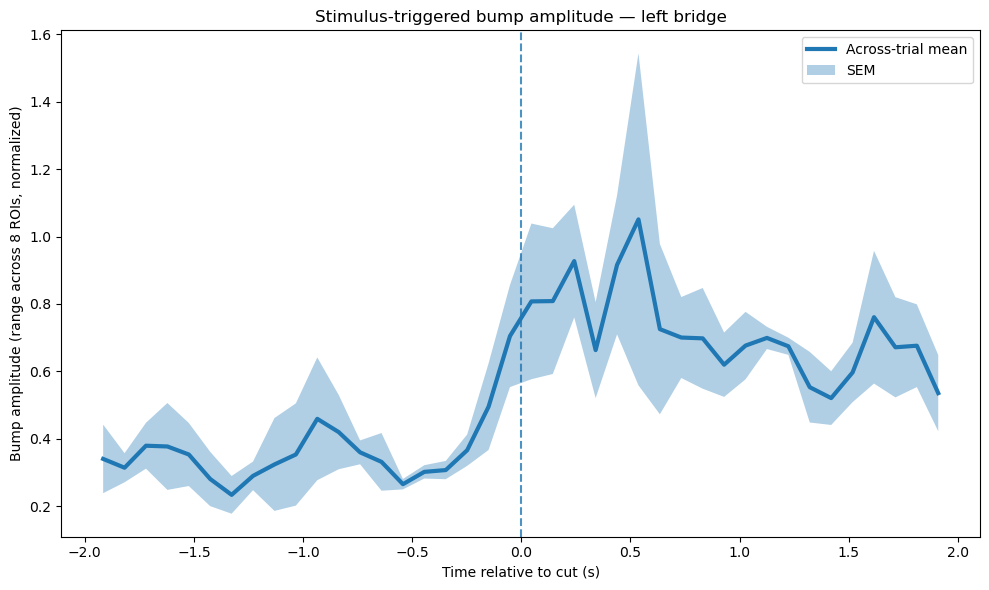

[left bridge] ROI with max increase: ROI 8 (mean peak = 0.867)
[left bridge] ROI with max decrease: ROI 8 (mean trough = -0.203)


In [70]:
# Example: look at the 5th stimulation across all trials, left bridge, ΔF/F baseline
res = compute_sta_bump_amplitude(
    rawF_dict,
    stim_index=9,         # pick which of the 9 stimulations
    run_filter=[3],      # None = include all runs; or e.g. [1] to include only *-001
    bridge="left",        # 'left' uses ROIs 1..8; 'right' uses 9..16
    norm="dff",           # 'dff' (default), 'zscore', or 'demean'
    post_stats_window=(0.0, 0.5)  # ROI peak up/down measured from 0..+2s
)
plot_sta_bump_amplitude(res)


In [53]:
import numpy as np
import pandas as pd
import re

def per_trial_roi_mean_winners(
    rawF_dict: dict,
    stim_index: int = 1,                     # which stim (1..9)
    run_filter: list | tuple | None = None,  # e.g., [1], [2], [1,2,3,4]; None = all
    bridge: str = "left",                    # 'left' (ROIs 1–8) or 'right' (ROIs 9–16)
    norm: str = "dff",                       # 'dff' | 'zscore' | 'demean'
    post_stats_window: tuple = (0.0, 0.5),   # compute winner using mean over this window
    return_long: bool = False
):
    """
    For each trial and chosen bridge, compute per-ROI mean in a post-stim window
    (relative to the event time trace `time_rel`) after a baseline computed on
    the pre-stim window (-0.5, 0.0). Select the increasing (max) and decreasing
    (min) 'winners' and return a per-trial table.

    Inputs
    ------
    rawF_dict: dict with key "by_trial":
        rawF_dict["by_trial"][trial_id] has:
          - "ROI_total": 8 or 16
          - "events": list; for each event i:
              ev["time_rel"]: shape (T,)
              ev["Raw_F_1"]..ev["Raw_F_8"] (and up to 16 if present): length T arrays

    Normalization
    -------------
    - 'dff':     per-ROI ΔF/F using pre window mean F0: (F - F0) / max(|F0|, 1e-6)
    - 'demean':  per-ROI baseline subtraction: F - F0
    - 'zscore':  per-ROI z-score using pre window (μ0, σ0): (F - μ0) / max(σ0, 1e-6)

    Returns
    -------
    winners_df (pd.DataFrame):
      columns = [
        trial_id, run, inc_roi, inc_mean, dec_roi, dec_mean
      ]
      - ROI numbers are in global indexing (1-based), i.e. 1–8 for left, 9–16 for right.

    If return_long=True, also returns long_df with per-ROI post-window means:
      columns = [trial_id, run, roi, post_mean]
    """
    # -------- helpers --------
    def _roi_slice_for_bridge(bridge: str, roi_total: int):
        if bridge == "left":
            return 0, 8
        if roi_total < 16:
            raise ValueError("Right bridge requested but ROI_total < 16")
        return 8, 16

    def _run_number_from_trial_id(trial_id: str) -> int:
        # expects ...-NNN at the *end* (e.g., TQfly001-003)
        m = re.search(r"-(\d{3})$", trial_id)
        return int(m.group(1)) if m else np.nan

    def _normalize_matrix_by_prewindow(X, t, norm_mode: str):
        """Normalize each ROI using statistics from pre-window (-0.5, 0.0)."""
        pre_mask = (t >= -0.5) & (t < 0.0)
        if not np.any(pre_mask):
            # If no pre frames, fall back to zero-baseline
            return X.copy()

        Xpre = X[pre_mask, :]
        mu0 = np.nanmean(Xpre, axis=0)
        if norm_mode == "dff":
            denom = np.maximum(np.abs(mu0), 1e-6)
            return (X - mu0[None, :]) / denom[None, :]
        elif norm_mode == "demean":
            return X - mu0[None, :]
        elif norm_mode == "zscore":
            sd0 = np.nanstd(Xpre, axis=0, ddof=1)
            sd0 = np.maximum(sd0, 1e-6)
            return (X - mu0[None, :]) / sd0[None, :]
        else:
            raise ValueError("norm must be 'dff', 'zscore', or 'demean'.")

    # -------- core --------
    by_trial: dict = rawF_dict.get("by_trial", {})
    if not isinstance(by_trial, dict) or len(by_trial) == 0:
        return (pd.DataFrame(), pd.DataFrame()) if return_long else pd.DataFrame()

    rows = []
    long_rows = []

    # normalize run_filter set (integers like 1 -> matches ...-001)
    if run_filter is not None:
        run_filter_set = set(int(x) for x in run_filter)
    else:
        run_filter_set = None

    for trial_id, tdata in by_trial.items():
        Rtot = int(tdata.get("ROI_total", 0))
        try:
            i0, i1 = _roi_slice_for_bridge(bridge, Rtot)
        except ValueError:
            # skip trials without the requested bridge
            continue

        run_num = _run_number_from_trial_id(trial_id)
        if run_filter_set is not None and int(run_num) not in run_filter_set:
            continue

        events = tdata.get("events", [])
        if not (1 <= stim_index <= len(events)):
            continue

        ev = events[stim_index - 1]
        t = np.asarray(ev.get("time_rel", []), float)
        if t.size == 0:
            continue

        # stack ROI columns for the chosen bridge
        roi_globals = list(range(i0 + 1, i1 + 1))  # 1-based ROI indices
        cols = []
        ok = True
        for r in roi_globals:
            key = f"Raw_F_{r}"
            if key not in ev:
                ok = False
                break
            arr = np.asarray(ev[key], float)
            if arr.size != t.size:
                ok = False
                break
            cols.append(arr)
        if not ok:
            continue

        X = np.column_stack(cols)  # shape (T, 8)

        # normalization using pre window (-0.5, 0.0)
        Xn = _normalize_matrix_by_prewindow(X, t, norm)

        # post-stats window
        t0, t1 = post_stats_window
        post_mask = (t >= t0) & (t <= t1)
        if not np.any(post_mask):
            continue

        post_means = np.nanmean(Xn[post_mask, :], axis=0)  # shape (8,)

        # winners
        inc_idx = int(np.nanargmax(post_means))  # 0..7
        dec_idx = int(np.nanargmin(post_means))  # 0..7

        inc_roi = roi_globals[inc_idx]
        dec_roi = roi_globals[dec_idx]
        inc_mean = float(post_means[inc_idx])
        dec_mean = float(post_means[dec_idx])

        rows.append({
            "trial_id": trial_id,
            "run": int(run_num) if np.isfinite(run_num) else np.nan,
            "inc_roi": inc_roi,
            "inc_mean": inc_mean,
            "dec_roi": dec_roi,
            "dec_mean": dec_mean,
        })

        if return_long:
            for k, roi in enumerate(roi_globals):
                long_rows.append({
                    "trial_id": trial_id,
                    "run": int(run_num) if np.isfinite(run_num) else np.nan,
                    "roi": roi,
                    "post_mean": float(post_means[k]),
                })

    winners_df = pd.DataFrame(rows)
    if winners_df.empty:
        return (winners_df, pd.DataFrame()) if return_long else winners_df

    # stable sort by trial_id then run (if present)
    if "run" in winners_df.columns:
        winners_df = winners_df.sort_values(["trial_id", "run"], kind="stable").reset_index(drop=True)

    if return_long:
        long_df = pd.DataFrame(long_rows)
        if not long_df.empty:
            long_df = long_df.sort_values(["trial_id", "run", "roi"], kind="stable").reset_index(drop=True)
        return winners_df, long_df

    return winners_df


In [54]:
import numpy as np
import pandas as pd

# ---- optional: use your provided PVA implementation verbatim ----
def PVA_radian_calcul_norm(
    dff_array,
    frame_number,
    ROI_NUM,
    norm="contrast",        # "contrast" | "mass-clip" | "mass-offset"
    return_degrees=False
):
    X = np.asarray(dff_array, dtype=float)
    if X.shape != (frame_number, ROI_NUM):
        raise ValueError(f"Shape mismatch: expected {(frame_number, ROI_NUM)}, got {X.shape}.")
    if ROI_NUM not in (8, 16):
        raise ValueError("ROI_NUM must be 8 or 16 for PB angles.")

    if ROI_NUM == 8:
        theta = np.array([np.pi/8, 3*np.pi/8, 5*np.pi/8, 7*np.pi/8,
                          -7*np.pi/8, -5*np.pi/8, -3*np.pi/8, -np.pi/8], float)
    else:  # 16
        theta = np.pi * (2*np.arange(ROI_NUM) + 1) / (2.0 * ROI_NUM)
        theta = (theta + np.pi) % (2*np.pi) - np.pi

    if norm == "contrast":
        W_for_vec = X
        denom = np.sum(np.abs(X), axis=1)
    elif norm == "mass-clip":
        W_for_vec = np.clip(X, 0, None)
        denom = np.sum(W_for_vec, axis=1)
    elif norm == "mass-offset":
        mins = X.min(axis=1, keepdims=True)
        W_for_vec = np.where(mins < 0, X - mins, X)
        denom = np.sum(W_for_vec, axis=1)
    else:
        raise ValueError("norm must be 'contrast', 'mass-clip', or 'mass-offset'.")

    c = np.cos(theta)[None, :]
    s = np.sin(theta)[None, :]
    Rx = np.sum(W_for_vec * c, axis=1)
    Ry = np.sum(W_for_vec * s, axis=1)

    angles = np.arctan2(Ry, Rx)
    Rlen   = np.hypot(Rx, Ry)
    strength = np.where(denom > 0, Rlen / denom, 0.0)
    strength = np.clip(strength, 0.0, 1.0)

    if return_degrees:
        angles = np.degrees(angles)
    return angles, strength


# ---- NEW: add-on wrapper that appends PVA summaries per trial ----
def per_trial_roi_mean_winners_with_pva(
    rawF_dict: dict,
    stim_index: int = 1,                     # which stim (1..9)
    run_filter: list | tuple | None = None,  # e.g., [1], [2], [1,2,3,4]; None = all
    bridge: str = "left",                    # 'left' (ROIs 1–8) or 'right' (ROIs 9–16)
    norm: str = "dff",                       # 'dff' | 'zscore' | 'demean'  (for winners only)
    post_stats_window: tuple = (0.0, 0.5),   # for average-trend winners
    pva_pre_window: tuple = (-0.5, 0.0),     # 500 ms before stim
    pva_post_window: tuple = ( 0.0, 0.5),    # 500 ms after  stim
    return_long: bool = False,               # passthrough: per-ROI means table

    # ---- New PVA-specific config ----
    pva_use_trialwide_dff: bool = True,      # use ΔF/F computed from entire trial (all events)
    pva_baseline_quantile: float = 0.05      # 5% lowest signal -> F0 = 5th percentile per ROI
):
    """
    Extends per_trial_roi_mean_winners by also computing PVA (angle & strength)
    using ΔF/F with a trial-wide baseline (F0 = 5th percentile per ROI across the whole trial).
    Winners computation is unchanged and still uses the 'norm' + pre-window baseline.

    Returns
    -------
    winners_df_with_pva [and optionally long_df]
      columns = [
        trial_id, run,
        inc_roi, inc_mean, dec_roi, dec_mean,
        pva_pre_angle_deg,  pva_pre_strength_mean,
        pva_post_angle_deg, pva_post_strength_mean,
        pva_delta_angle_deg
      ]
    """
    # 1) First, reuse your existing function to get inc/dec winners & (optionally) long_df.
    if return_long:
        winners_df, long_df = per_trial_roi_mean_winners(
            rawF_dict=rawF_dict,
            stim_index=stim_index,
            run_filter=run_filter,
            bridge=bridge,
            norm=norm,
            post_stats_window=post_stats_window,
            return_long=True
        )
    else:
        winners_df = per_trial_roi_mean_winners(
            rawF_dict=rawF_dict,
            stim_index=stim_index,
            run_filter=run_filter,
            bridge=bridge,
            norm=norm,
            post_stats_window=post_stats_window,
            return_long=False
        )

    if winners_df.empty:
        return (winners_df, pd.DataFrame()) if return_long else winners_df

    # 2) Helpers
    def _roi_slice_for_bridge(bridge: str, roi_total: int):
        if bridge == "left":
            return 0, 8
        if roi_total < 16:
            raise ValueError("Right bridge requested but ROI_total < 16")
        return 8, 16

    def _run_number_from_trial_id(trial_id: str) -> int:
        import re
        m = re.search(r"-(\d{3})$", trial_id)
        return int(m.group(1)) if m else np.nan

    def _concat_all_events_for_rois(tdata: dict, roi_globals: list[int]) -> np.ndarray:
        """Concatenate Raw_F_* across all events for the selected 8 ROIs (T_total, 8)."""
        stacks = []
        for ev in tdata.get("events", []):
            cols = []
            ok = True
            for r in roi_globals:
                key = f"Raw_F_{r}"
                if key not in ev:
                    ok = False
                    break
                arr = np.asarray(ev[key], float)
                cols.append(arr)
            if not ok or len(cols) == 0:
                continue
            Xev = np.column_stack(cols)
            stacks.append(Xev)
        if len(stacks) == 0:
            return np.empty((0, len(roi_globals)), dtype=float)
        return np.vstack(stacks)

    def _trialwide_dff(X_window: np.ndarray, F0: np.ndarray) -> np.ndarray:
        """ΔF/F for a window using trial-wide baseline F0 per ROI."""
        denom = np.maximum(np.abs(F0), 1e-6)
        return (X_window - F0[None, :]) / denom[None, :]

    # 3) For each trial in winners_df, compute PVA in pre/post windows
    add_cols = {
        "pva_pre_angle_deg": [],
        "pva_pre_strength_mean": [],
        "pva_post_angle_deg": [],
        "pva_post_strength_mean": [],
        "pva_delta_angle_deg": [],
    }

    # Helper for circular difference in degrees wrapped to (-180, 180]
    def circ_diff_deg(a_deg, b_deg):
        d = (a_deg - b_deg + 180.0) % 360.0 - 180.0
        return d

    by_trial = rawF_dict["by_trial"]

    for _, row in winners_df.iterrows():
        trial_id = row["trial_id"]
        tdata = by_trial.get(trial_id, None)
        if tdata is None:
            for k in add_cols: add_cols[k].append(np.nan)
            continue

        Rtot = int(tdata["ROI_total"])
        try:
            i0, i1 = _roi_slice_for_bridge(bridge, Rtot)
        except ValueError:
            for k in add_cols: add_cols[k].append(np.nan)
            continue
        roi_globals = list(range(i0 + 1, i1 + 1))

        # fetch event
        events = tdata["events"]
        if not (1 <= stim_index <= len(events)):
            for k in add_cols: add_cols[k].append(np.nan)
            continue
        ev = events[stim_index - 1]
        t = np.asarray(ev["time_rel"], float)
        if t.size == 0:
            for k in add_cols: add_cols[k].append(np.nan)
            continue

        # stack 8-ROI matrix (T_event, 8) for this event window
        Fcols = []
        ok = True
        for r in roi_globals:
            key = f"Raw_F_{r}"
            if key not in ev:
                ok = False
                break
            arr = np.asarray(ev[key], float)
            if arr.size != t.size:
                ok = False
                break
            Fcols.append(arr)
        if not ok or len(Fcols) == 0:
            for k in add_cols: add_cols[k].append(np.nan)
            continue
        X = np.column_stack(Fcols)

        # --- pick frames for pre/post windows
        pre_mask  = (t >= pva_pre_window[0])  & (t <  pva_pre_window[1])
        post_mask = (t >= pva_post_window[0]) & (t <= pva_post_window[1])

        if not np.any(pre_mask) or not np.any(post_mask):
            for k in add_cols: add_cols[k].append(np.nan)
            continue

        X_pre  = X[pre_mask, :]
        X_post = X[post_mask, :]

        # --- Build trial-wide ΔF/F baseline (per ROI, 5th percentile across entire trial)
        if pva_use_trialwide_dff:
            X_all = _concat_all_events_for_rois(tdata, roi_globals)  # (T_total, 8) or empty
            if X_all.shape[0] == 0:
                # Fallback: use this event’s full window if entire trial not available
                X_all = X
            with np.errstate(invalid='ignore'):
                F0 = np.nanpercentile(X_all, pva_baseline_quantile * 100.0, axis=0)  # shape (8,)
            # ΔF/F for the two windows using trial-wide F0
            X_pre_dff  = _trialwide_dff(X_pre,  F0)
            X_post_dff = _trialwide_dff(X_post, F0)
            # PVA on ΔF/F using contrast (signed) weights
            ang_pre,  str_pre  = PVA_radian_calcul_norm(X_pre_dff,  X_pre_dff.shape[0],  8, norm="contrast", return_degrees=True)
            ang_post, str_post = PVA_radian_calcul_norm(X_post_dff, X_post_dff.shape[0], 8, norm="contrast", return_degrees=True)
        else:
            # (Old behavior) map your winners 'norm' to a PVA mode
            if norm == "zscore":
                pva_mode = "contrast"
            elif norm in ("dff", "demean"):
                pva_mode = "mass-offset"
            else:
                pva_mode = "mass-offset"
            ang_pre,  str_pre  = PVA_radian_calcul_norm(X_pre,  X_pre.shape[0],  8, norm=pva_mode, return_degrees=True)
            ang_post, str_post = PVA_radian_calcul_norm(X_post, X_post.shape[0], 8, norm=pva_mode, return_degrees=True)

        # Strength-weighted circular means for angles within each window
        def weighted_circ_mean_deg(angles_deg, weights):
            ang_rad = np.deg2rad(angles_deg)
            z = np.sum(weights * np.exp(1j * ang_rad))
            if np.isclose(np.abs(z), 0.0):
                return np.nan
            return np.degrees(np.angle(z))

        pre_angle_deg  = weighted_circ_mean_deg(ang_pre,  str_pre)
        post_angle_deg = weighted_circ_mean_deg(ang_post, str_post)
        pre_strength_mean  = float(np.nanmean(str_pre))
        post_strength_mean = float(np.nanmean(str_post))
        delta_deg = circ_diff_deg(post_angle_deg, pre_angle_deg) if np.isfinite(pre_angle_deg) and np.isfinite(post_angle_deg) else np.nan

        add_cols["pva_pre_angle_deg"].append(pre_angle_deg)
        add_cols["pva_pre_strength_mean"].append(pre_strength_mean)
        add_cols["pva_post_angle_deg"].append(post_angle_deg)
        add_cols["pva_post_strength_mean"].append(post_strength_mean)
        add_cols["pva_delta_angle_deg"].append(delta_deg)

    winners_df_pva = winners_df.copy()
    for k, v in add_cols.items():
        winners_df_pva[k] = v

    if return_long:
        return winners_df_pva, long_df
    return winners_df_pva


In [55]:
# Same filters you’ve been using; now you also get PVA summaries per trial
winners_pva = per_trial_roi_mean_winners_with_pva(
    rawF_dict,
    stim_index=9,
    run_filter=[1],          # e.g., only *-004 trials
    bridge="left",          # ROIs 9–16
    norm="dff",              # maps to PVA mode 'mass-offset'
    post_stats_window=(0.0, 0.5),
    pva_pre_window=(-0.5, 0.0),
    pva_post_window=(0.0, 0.5),
    return_long=False
)
print(winners_pva)

       trial_id  run  inc_roi  inc_mean  dec_roi  dec_mean  pva_pre_angle_deg   
0  TQfly771-001    1        2  0.138187        7 -0.261071         -30.727270  \
1  TQfly772-001    1        8  0.343515        5 -0.268813         -84.362905   
2  TQfly773-001    1        4  0.286298        8 -0.107790         -10.768054   

   pva_pre_strength_mean  pva_post_angle_deg  pva_post_strength_mean   
0               0.387421           25.269211                0.643579  \
1               0.389506          -16.035343                0.453067   
2               0.349554          129.565314                0.372380   

   pva_delta_angle_deg  
0            55.996482  
1            68.327562  
2           140.333368  


In [56]:
def plot_polar_roi_summary(
    rawF_dict: dict,
    stim_index: int = 1,
    run_filter=None,                  # e.g., [1], [4], or None for all
    bridge: str = "left",             # 'left' (ROIs 1–8) or 'right' (ROIs 9–16)
    norm: str = "dff",                # 'dff' | 'zscore' | 'demean'
    post_stats_window=(0.0, 0.5),
    mode: str = "winners",            # 'winners' or 'pva'
    jitter_deg: float = 0.0,          # small angular jitter to reduce overlap
    same_rmax: bool = True,           # match radial limits across subplots
    title_prefix: str = "Polar summary"
):
    """
    mode='winners': two plots = (Max Increase) & (Max Decrease)
                    angle = ROI (1..8 in the chosen bridge), radius = |mean signal|
    mode='pva'    : two plots = (PVA Pre) & (PVA Post)
                    angle = PVA angle, radius = PVA strength (0..1)
    """
    import numpy as np
    import matplotlib.pyplot as plt

    # -------- helpers ----------
    def fly_id_from_trial(trial_id: str) -> str:
        return trial_id.split("-")[0]

    def roi_to_angle(roi_global: int, which_bridge: str) -> float:
        # map within-bridge index k=1..8 -> angle in [0, 2π)
        k = roi_global if which_bridge == "left" else roi_global - 8
        return 2.0 * np.pi * (k - 1) / 8.0

    unit = {"dff": "ΔF/F", "zscore": "z-score", "demean": "ΔF"}[norm]
    jitter_rad = np.deg2rad(jitter_deg)

    # -------- collect data ----------
    if mode == "winners":
        winners, _ = per_trial_roi_mean_winners(
            rawF_dict,
            stim_index=stim_index,
            run_filter=run_filter,
            bridge=bridge,
            norm=norm,
            post_stats_window=post_stats_window,
            return_long=True
        )
        if winners.empty:
            raise RuntimeError("No trials matched filters for 'winners' mode.")

        flies = winners["trial_id"].map(fly_id_from_trial).unique().tolist()
        color_map = {fly: plt.cm.tab20(i % 20) for i, fly in enumerate(sorted(flies))}

        # Prepare figure
        fig = plt.figure(figsize=(12, 6))
        ax_inc = plt.subplot(1, 2, 1, projection="polar")
        ax_dec = plt.subplot(1, 2, 2, projection="polar")

        # Polar axis cosmetics
        theta_ticks = np.linspace(0, 2*np.pi, 8, endpoint=False)
        tick_labels = [f"ROI {k}" for k in range(1, 9)]
        for ax in (ax_inc, ax_dec):
            ax.set_xticks(theta_ticks)
            ax.set_xticklabels(tick_labels)
            ax.set_theta_direction(-1)
            ax.set_theta_zero_location("N")
            ax.set_ylabel(f"Mean signal ({unit})", labelpad=20)
            ax.yaxis.set_label_position("left")

        # Plot points
        rvals_all = []
        for _, row in winners.iterrows():
            trial_id = row["trial_id"]
            fly = fly_id_from_trial(trial_id)
            c = color_map[fly]

            # Increase
            th_inc = roi_to_angle(int(row["inc_roi"]), bridge)
            if jitter_rad: th_inc += (np.random.rand()-0.5)*2*jitter_rad
            r_inc = float(abs(row["inc_mean"]))
            rvals_all.append(r_inc)
            ax_inc.plot(th_inc, r_inc, "o", ms=8, color=c, alpha=0.9)

            # Decrease
            th_dec = roi_to_angle(int(row["dec_roi"]), bridge)
            if jitter_rad: th_dec += (np.random.rand()-0.5)*2*jitter_rad
            r_dec = float(abs(row["dec_mean"]))  # radius is magnitude
            rvals_all.append(r_dec)
            ax_dec.plot(th_dec, r_dec, "o", ms=8, color=c, alpha=0.9)

        # Match radial limits if requested
        if same_rmax and len(rvals_all):
            rmax = max(rvals_all)
            for ax in (ax_inc, ax_dec):
                ax.set_rlim(0, max(1e-6, rmax))

        # Legends & titles
        handles = [plt.Line2D([0],[0], marker='o', linestyle='None',
                              color=color_map[f], label=f) for f in sorted(flies)]
        ax_inc.legend(handles=handles, bbox_to_anchor=(1.05, 1.05),
                      loc="upper left", title="Fly")
        ax_dec.legend(handles=handles, bbox_to_anchor=(1.05, 1.05),
                      loc="upper left", title="Fly")

        filt_txt = "all runs" if (run_filter is None) else f"runs={list(run_filter)}"
        ax_inc.set_title(f"{title_prefix}\nMax Increase • {bridge} • stim={stim_index} • {filt_txt}")
        ax_dec.set_title(f"{title_prefix}\nMax Decrease • {bridge} • stim={stim_index} • {filt_txt}")

        plt.tight_layout()
        plt.show()
        return  # end mode='winners'

    elif mode == "pva":
        # Use the add-on that computes PVA per trial
        winners_pva = per_trial_roi_mean_winners_with_pva(
            rawF_dict,
            stim_index=stim_index,
            run_filter=run_filter,
            bridge=bridge,
            norm=norm,
            post_stats_window=post_stats_window,
            pva_pre_window=(-0.5, 0.0),
            pva_post_window=(0.0, 0.5),
            return_long=False
        )
        if winners_pva.empty:
            raise RuntimeError("No trials matched filters for 'pva' mode.")

        flies = winners_pva["trial_id"].map(fly_id_from_trial).unique().tolist()
        color_map = {fly: plt.cm.tab20(i % 20) for i, fly in enumerate(sorted(flies))}

        # Prepare figure
        fig = plt.figure(figsize=(12, 6))
        ax_pre = plt.subplot(1, 2, 1, projection="polar")
        ax_post = plt.subplot(1, 2, 2, projection="polar")

        # Axis cosmetics (PVA angles don’t align to ROI ticks, so show degrees every 45°)
        theta_ticks = np.deg2rad(np.arange(0, 360, 45))
        tick_labels = [f"{int(d)}°" for d in np.arange(0, 360, 45)]
        for ax in (ax_pre, ax_post):
            ax.set_xticks(theta_ticks)
            ax.set_xticklabels(tick_labels)
            ax.set_theta_direction(-1)
            ax.set_theta_zero_location("N")
            ax.set_ylabel("PVA strength (0–1)", labelpad=20)
            ax.yaxis.set_label_position("left")
            ax.set_rlim(0, 1.0)  # strength is in [0,1]

        # Plot PVA angles/strengths
        rvals_all = []
        for _, row in winners_pva.iterrows():
            trial_id = row["trial_id"]
            fly = fly_id_from_trial(trial_id)
            c = color_map[fly]

            # Pre
            ang_pre_deg = row["pva_pre_angle_deg"]
            str_pre     = row["pva_pre_strength_mean"]
            if np.isfinite(ang_pre_deg) and np.isfinite(str_pre):
                th = np.deg2rad(ang_pre_deg % 360.0)
                r  = float(np.clip(str_pre, 0.0, 1.0))
                if jitter_rad: th += (np.random.rand()-0.5)*2*jitter_rad
                rvals_all.append(r)
                ax_pre.plot(th, r, "o", ms=8, color=c, alpha=0.9)

            # Post
            ang_post_deg = row["pva_post_angle_deg"]
            str_post     = row["pva_post_strength_mean"]
            if np.isfinite(ang_post_deg) and np.isfinite(str_post):
                th = np.deg2rad(ang_post_deg % 360.0)
                r  = float(np.clip(str_post, 0.0, 1.0))
                if jitter_rad: th += (np.random.rand()-0.5)*2*jitter_rad
                rvals_all.append(r)
                ax_post.plot(th, r, "o", ms=8, color=c, alpha=0.9)

        # same_rmax honored within [0,1]
        if same_rmax and len(rvals_all):
            rmax = min(1.0, max(rvals_all))
            for ax in (ax_pre, ax_post):
                ax.set_rlim(0, max(1e-6, rmax))

        # Legends & titles
        handles = [plt.Line2D([0],[0], marker='o', linestyle='None',
                              color=color_map[f], label=f) for f in sorted(flies)]
        ax_pre.legend(handles=handles, bbox_to_anchor=(1.05, 1.05),
                      loc="upper left", title="Fly")
        ax_post.legend(handles=handles, bbox_to_anchor=(1.05, 1.05),
                       loc="upper left", title="Fly")

        filt_txt = "all runs" if (run_filter is None) else f"runs={list(run_filter)}"
        ax_pre.set_title(f"{title_prefix}\nPVA Pre (−0.5..0 s) • {bridge} • stim={stim_index} • {filt_txt}")
        ax_post.set_title(f"{title_prefix}\nPVA Post (0..0.5 s) • {bridge} • stim={stim_index} • {filt_txt}")

        plt.tight_layout()
        plt.show()
        return

    else:
        raise ValueError("mode must be 'winners' or 'pva'")


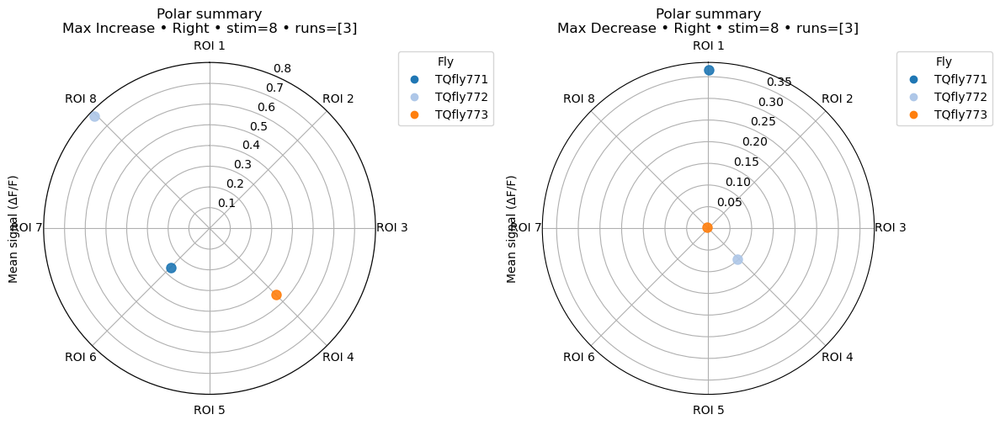

In [57]:
# 1) Your existing view (max increase/decrease), radius = |mean signal|
plot_polar_roi_summary(
    rawF_dict,
    stim_index=8,
    run_filter=[3],
    bridge="Right",
    norm="dff",
    post_stats_window=(0.0, 0.5),
    mode="winners",
    jitter_deg=2.0,
    same_rmax=False
)




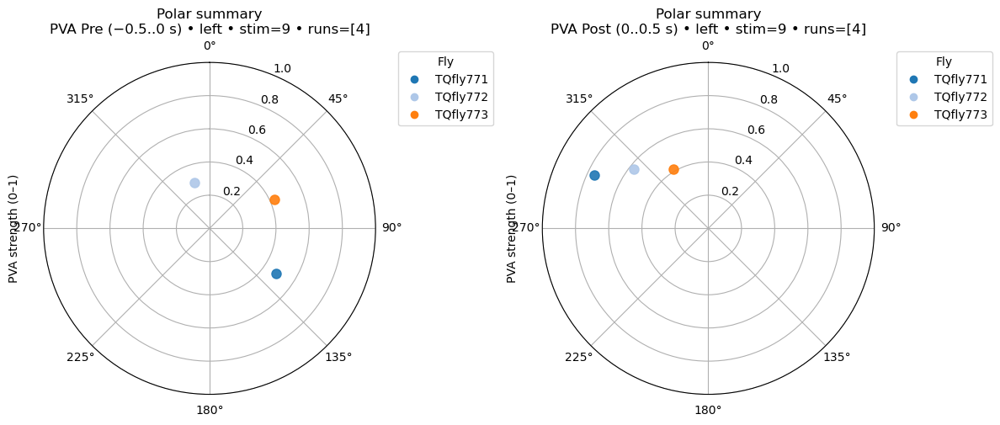

In [69]:
# 2) New PVA view (pre vs post), radius = PVA strength (0–1), angle = PVA angle
plot_polar_roi_summary(
    rawF_dict,
    stim_index=9,
    run_filter=[4],
    bridge="left",
    norm="dff",
    post_stats_window=(0.0, 0.3),
    mode="pva",
    jitter_deg=2.0,
    same_rmax=False
)
